***
## A Query Answering Machine that Predicts the Country from Images

### By Salman Hajizada (shajizad), Abdulrahman Al-Taweel (ataweel), Ravin Kumar (ravink)

## D1: Initial Proposal

***


# <font color = 'skyblue' size = 5><b> Project Specification </b></font>

<font color = 'steelblue' size = 3><b> Our project aims to develop a query answering machine to determine the city of origin for given images. We focus on accurately classifying images into their respective countries of origin, exploring how well machine learning techniques can handle this task for city images. </b></font>

## <font color = 'skyblue' size = 5><b> Image Selection and Quality Assurance </b></font>

<font color = 'steelblue' size = 3><b> To curate our dataset, we scrape images from Google Images using specific prompts. These prompts ensure diverse landscapes and cityscapes from different countries. Quality assurance is vital; thus, we select prompts that yield high-quality images representing various environments and urban settings. By using similar prompts leading to better quality images, we aim to mitigate potential biases and improve dataset quality. </b></font>

## <font color = 'skyblue' size = 5><b> Metadata Usage </b></font>

<font color = 'steelblue' size = 3><b> We opt not to incorporate metadata such as geotags or timestamps. Relying solely on image features will result in a more robust and challenging classification task. </b></font>

# <font color = 'skyblue' size = 5><b> Project Idea </b></font>

<font color = 'steelblue' size = 3><b> Our Query Answering Machine functions as a classifier, predicting city of origin from aerial city view images. This supervised learning classification task trains on a dataset of labeled city images. </b></font>

## <font color = 'skyblue' size = 5><b> Features and Models </b></font>

<font color = 'steelblue' size = 3><b> We extract various features from images, including raw grayscale pixel values, SIFT, HOG, histogram features, Sobel, and Canny edge detection. Additionally, a Convolutional Neural Network (CNN) automatically extracts features. For classification, we employ a diverse set of models, including CNNs, K-Nearest Neighbors (K-NN), Support Vector Machines (SVM), and decision trees. </b></font>

## <font color = 'skyblue' size = 5><b> Image Selection </b></font>

<font color = 'steelblue' size = 3><b> We limit images to aerial city views to ensure consistency and focus. This helps capture distinctive features of city landscapes while reducing dataset variability. </b></font>

## <font color = 'skyblue' size = 5><b> Scope of Classification </b></font>

<font color = 'steelblue' size = 3><b> We select a subset of 18 cities for initial experimentation: Abu Dhabi, Brasi­lia, Buenos Aires, Cairo, Canberra, Lima, London, Manila, Mexico City, Moscow, Nairobi, New York, Ottawa, Paris, Rabat, Rome, Tokyo, and Wellington. Focusing on a subset of countries helps manage the complexity of the classification task while providing a diverse representation of city landscapes. </b></font>

## <font color = 'skyblue' size = 5><b> Output Determination </b></font>

<font color = 'steelblue' size = 3><b> The classifier's output is deterministic for K-NN, SVM, Bagging, and Boosting decision stump models, providing a single city as output. However, for CNN, the output is probabilistic, providing probabilities for each city. </b></font>

# <font color = 'skyblue' size = 5><b> Division of Work </b></font>

- <font color = 'steelblue' size = 3><b> Abdulrahman Al-Taweel: Responsible for data cleaning, wrangling, and CNN work. Collaborates with Salman and Ravin to ensure cleaned data suitability, providing insights on model training and feature engineering. </b></font>
  
- <font color = 'steelblue' size = 3><b> Salman Hajizada: Focuses on image scraping, compression, and running K-NN, SVM, and Decision Tree models. Actively communicates with Abdulrahman and Ravin, providing insights into model selection and evaluation. </b></font>
  
- <font color = 'steelblue' size = 3><b> Ravin Kumar: Tasked with feature engineering and CNN training. Collaborates closely with Abdulrahman and Salman, offering input on model selection and evaluation. </b></font>

## <font color = 'skyblue' size = 5><b> Collaboration and Contribution </b></font>

<font color = 'steelblue' size = 3><b> Despite designated responsibilities, collaboration is key. We actively share insights, ideas, and feedback, ensuring combined efforts lead to a successful outcome. Each team member contributes to various project aspects, leveraging expertise and knowledge to enhance project development. </b></font>

# <font color = 'skyblue' size = 5><b> Dataset </b></font>

<font color = 'steelblue' size = 3><b> Our dataset underwent careful selection, settling for 18 cities with 500 images each. This decision balances task complexity with dataset diversity. Images were resized to 256x256 or 128x128 pixels for compatibility, ensuring consistency while optimizing performance.

We used various Google and DuckDuckGo prompts to gather images, tailored to each city to capture diverse aerial views. Despite targeted prompts, dataset diversity still poses challenges for model learning. </b></font>

***
## D2: Data Preparation
***

## <font color = 'skyblue' size = 5>  **Goal: To classify images of 18 popular cities by country** </font>

<font color = 'steelblue' size = 3> **We will first do some simple setup before getting to the dataset** </font>

<font color = 'steelblue' size = 3> **We use a variable to seamlessly determine filepaths when switching between running the script on kaggle and running on local machines** </font>

In [1]:
# whether notebook is running on kaggle or not 
KAGGLE = False

<font color = 'steelblue' size = 3> **Make sure that tensorflow is using GPUs for training if using kaggle** </font>

In [2]:
if KAGGLE:
    import tensorflow as tf
    tf.config.list_physical_devices('GPU')

 <font color = 'skyblue' size = 5> **Import all the modules that will be needed** </font>

In [3]:
import os
import skimage
import cv2
from skimage import util,filters
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import random
import re
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, Flatten, MaxPool2D, Input

# <font color = 'skyblue' size = 6>  **Dataset** </font>

 ## <font color = 'skyblue' size = 5>  **2.1 Data Collection** </font>

<font color = 'steelblue' size = 3> **The data was scraped from Google images using the python scripts `image_scraper.py` and `image_downloader.py`** </font>

<font color = 'steelblue' size = 3> **The images are then cropped if they have banners with a website name at the bottom of them as some websites put a solid colour banner on images from their site.** </font>

In [3]:

def crop_and_save(filepath: str):
    """crops an image to get rid of a website banner at the bottom of the image 
       if it contains one and saves it at the filepath provided

    Args:
        filepath (str): the filepath of the image
    """

    # read the image
    image = cv2.imread(filepath)
    try:
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    except:
        try:
            image = image.astype(np.uint8)
            gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        except Exception as e:
            print(f'failed to crop {filepath} with error\n{e}')
            return
        
    height = gray_image.shape[-2]

    # if the image does not have a banner then ignore it
    if abs(int(gray_image[height - 1, 0]) - int(gray_image[height-11, 0])) > 15:
        return

    # go from bottom and find the first row from bottom that has a significant color change
    change_row = height - 1
    for row in range(height - 1, -1, -1):
        if abs(int(gray_image[row, 0]) - int(gray_image[height - 1, 0])) > 15:
            change_row = row
            break

    cropped_image = image[:change_row]

    cv2.imwrite(filepath, cropped_image)

 <font color = 'steelblue' size = 3> **Run the function over all the images** </font>

In [4]:
# run the crop_and_save function on all images in the dataset
base_path = r'./dataset'

for path in tqdm(os.listdir(base_path)):
    for i in tqdm(os.listdir(f'{base_path}/{path}')):
        crop_and_save(f'{base_path}/{path}/{i}')

###  <font color = 'skyblue' size = 5> **Reading the data** </font>

<font color = 'steelblue' size = 3> **Get the list of cities that will be the classes for the model** </font> 

In [6]:
# Returns a list of cities sorted alphabetically
def cities_alphabetical():
    return ['Abu Dhabi',
             'Brasilia',
             'Buenos Aires',
             'Cairo',
             'Canberra',
             'Lima',
             'London',
             'Manila',
             'Mexico City',
             'Moscow',
             'Nairobi',
             'New York',
             'Ottawa',
             'Paris',
             'Rabat',
             'Rome',
             'Tokyo',
             'Wellington']
cities_alphabetical()

['Abu Dhabi',
 'Brasilia',
 'Buenos Aires',
 'Cairo',
 'Canberra',
 'Lima',
 'London',
 'Manila',
 'Mexico City',
 'Moscow',
 'Nairobi',
 'New York',
 'Ottawa',
 'Paris',
 'Rabat',
 'Rome',
 'Tokyo',
 'Wellington']

In [7]:
def load_images(paths):
    images = {}
    cities_dict = {}
    cities = []
    labels = []
    # image_ids = []
    for i, path in enumerate(paths):
        city_name = os.path.basename(path)  # Extract folder name
        cities_dict[i] = city_name
        cities.append(i)
        ids = os.listdir(path)
        for fname in tqdm(ids):
            image_id = fname[:-4]
            try:
                img = cv2.imread(os.path.join(path, fname))
                assert(type(img) == np.ndarray)
                images[image_id] = img
                labels.append(i)
            except Exception as e:
                print("Error loading", fname, ":", e)
    labels = np.array(labels)
    cities = np.array(cities)
    print("Loaded {} images".format(len(images)))
    return images,labels,cities,cities_dict

<font color = 'steelblue' size = 3> **Function that sorts the images correctly so that label "100" does not come before "11"** </font>

In [14]:
def extract_natural_key(string):
    return [int(s) if s.isdigit() else s.lower() for s in re.findall(r'(\d+|\D+)', string)]

def sort(strings):
    return sorted(strings, key=extract_natural_key)

<font color = 'steelblue' size = 3> **Load the images into memory** </font>

In [9]:
cities_list = cities_alphabetical()
base_path = r'/kaggle/input/city-images/dataset/' if KAGGLE else r'./images_fresh/'
paths = [base_path + city for city in cities_list]

images,labels,cities,cities_dict = load_images(paths)
num_imgs = len(images)
num_classes = len(cities_list)

100%|██████████| 483/483 [00:11<00:00, 41.14it/s]

Loaded 8727 images


##   <font color = 'skyblue' size = 6> **2.2, 2.3 Exploratory Data Analysis and Data Cleaning** </font> 

<font color = 'steelblue' size = 4> **We will analyze our data by first checking the number of examples and the average sizes of images** </font> 

<font color = 'steelblue' size = 4> **We will then resize all images to the same size to keep consistency on all images for future usage** </font> 

<font color = 'steelblue' size = 4> **We will store both the RGB images and grayscale images, as we will use both for training models** </font> 

In [12]:
#function to the number of images and the average image sizes
def get_info(images):
    num_images = len(images)
    sizes = [img.shape for img in images.values()]
    avg_size = np.mean(sizes, axis=0)
    print("Number of images:", num_images)
    print("Average image sizes (height, width, channels):", avg_size,"\n")

#function to rescale the images all to the same ize
def scale_images(images, target_size=(256, 256)):
    scaled_images = {}
    for image_id, image in tqdm(images.items()):
        scaled_image = cv2.resize(image, target_size, interpolation=cv2.INTER_AREA)
        scaled_images[image_id] = scaled_image

    return scaled_images

#function to turn images to rgb + grayscal
def rgb_and_grayscale_images(images):
    rgb_images = np.array([images[key] for key in sort(images.keys())])
    grayscale_images = np.array([cv2.cvtColor(images[key], cv2.COLOR_BGR2GRAY) for key in sort(images.keys())])
    return rgb_images,grayscale_images

In [11]:
get_info(images)
img_shape = (128, 128)
scaled_images = scale_images(images, target_size=img_shape)
get_info(scaled_images)

Number of images: 8727
Average image sizes (height, width, channels): [ 929.03380314 1373.88369428    3.        ] 



100%|██████████| 8727/8727 [03:40<00:00, 39.66it/s] 

Number of images: 8727
Average image sizes (height, width, channels): [128. 128.   3.] 



<font color = 'steelblue' size = 4> **We need to check the distribution of labels in the dataset to make sure that all the classes have roughly equal number of images** </font> 

In [5]:
#function to plot the label distribution
def label_distribution(labels):
    unique_labels, label_counts = np.unique(labels, return_counts=True)

    plt.figure(figsize=(50, 6))
    plt.bar(unique_labels, label_counts, color='skyblue')
    plt.xlabel('Label')
    plt.ylabel('frequency')
    plt.title('Distribution of Labels')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.xticks(unique_labels)
    plt.tight_layout()
    plt.show()

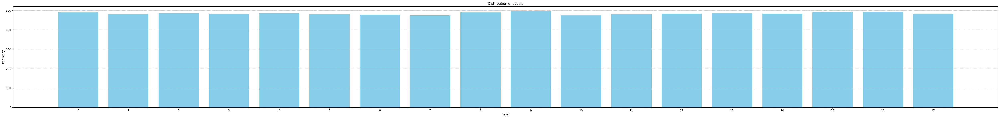

In [10]:
label_distribution(labels)

<font color = 'steelblue' size = 4> **As we can see, the dataset distribution of label images are balanced, they are around 450-500 images in each city for 18 cities** </font> 

In [15]:
rgb_images,grayscale_images = rgb_and_grayscale_images(scaled_images)

<font color = 'steelblue' size = 4> **Get random images and visualize the pixel values and their respective visualized images** </font> 

In [13]:
#function to get random samples of the images
def random_samples(labels, cities, num_images):
    random_indices = []
    for city in cities:
        label_indices = np.where(labels == city)[0]
        selected_indices = random.sample(list(label_indices), min(num_images, len(label_indices)))
        random_indices.extend([(city, idx) for idx in selected_indices])
    randoms = random.sample(random_indices, num_images)
    return randoms

#function to visualize the number of images you want to display
def visualize_images(images, cities_dict, idx,num_images):
    rows, cols = 1, num_images
    fig, subplots = plt.subplots(rows, cols, figsize=(12, 4))
    for i in range(cols):
        subplots[i].axis('off')
        image_for_city = images[idx[i][1]]
        city = cities_dict[idx[i][0]]
        subplots[i].set_title("City: " + city, fontsize=12)  # Corrected title concatenation
        img = cv2.cvtColor(image_for_city, cv2.COLOR_BGR2RGB)
        subplots[i].imshow(img)
    plt.tight_layout()
    plt.show()


#function to plot the pixel values of the same images displayed from function above
def visualize_hist(images, cities_dict, idx, num_images):
    rows,cols = 1, num_images
    fig, subplots = plt.subplots(rows,cols,figsize=(12,4))
    for i in range(cols):
        image_for_city = images[idx[i][1]]
        city = cities_dict[idx[i][0]]
        subplots[i].set_title("City: " + city, fontsize=12)
        subplots[i].hist(image_for_city.flatten(),30,color = "skyblue",edgecolor='black',linewidth=0.3)
    plt.tight_layout()
    plt.show()

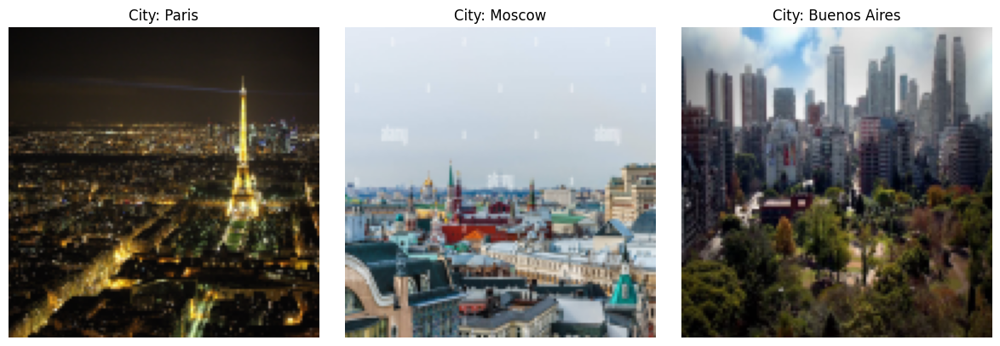

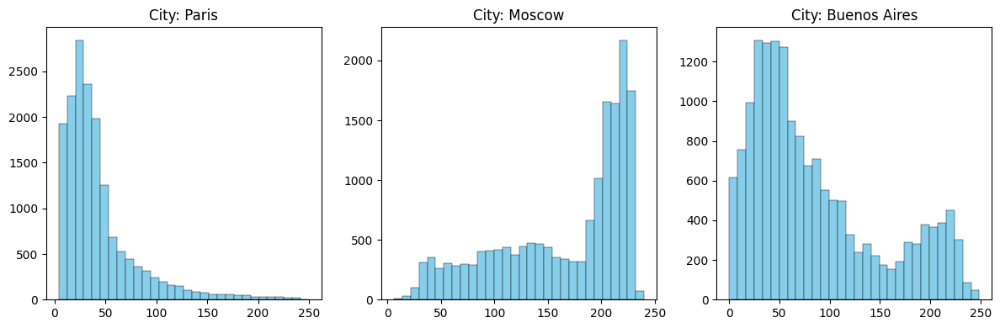

In [14]:
rnd_idx = random_samples(labels,cities,3)
visualize_images(rgb_images,cities_dict,rnd_idx,3)
visualize_hist(grayscale_images,cities_dict,rnd_idx,3)

<font color = 'steelblue' size = 4> **As we can see, the images are stored properly and can be visualized through the histograms** </font> 
***

<font color = 'steelblue' size = 4> **We intentionally add noise to a part of the dataset to dirty the data. Afterwards, we apply a median filter to eliminate any noise, ensuring our data is cleaner and more reliable for analysis.** </font> 

In [24]:
#function to randomly apply salt and pepper noise on the images
def apply_noise(images,amount=0.05,probability = 0.7):
    noisy_images = []
    for image in images:
        if random.random() > probability:
            noisy_image = util.random_noise(image, mode='s&p', amount=amount)
            noisy_images.append(noisy_image)
        else:
            noisy_images.append(image)

    return np.array(noisy_images)

#function to apply the median filter on all images to remove any chance of noisy images
def remove_noise(noisy_images,strength = 5):
    not_noisy_images = []
    for noisy_image in noisy_images:
        not_noisy_image = filters.median(noisy_image,footprint= strength)
        not_noisy_images.append(not_noisy_image)
    return np.array(not_noisy_images)

In [17]:
noisy_images = apply_noise(grayscale_images)
sample_footprint = np.array([[1,1, 1],
                             [1, 1, 1],
                             [1, 1, 1]])
not_noisy_images = remove_noise(noisy_images,sample_footprint)

<font color = 'steelblue' size = 4> **We then evaluate pairs of images: one with added noise and the other noise-free. We assess the need for noise reduction based on a predefined threshold, visualizes the differences, and retains the noise-free version if noise reduction is deemed unnecessary.** </font> 

In [33]:
#function to compare difference before and after median filter applied and clean the data and save new images into np array to ensure image cleansiness
def compare_image_difference(images, labels, countries, noisy_images, not_noisy_images, threshold=0.8):
    new_images = []
    image_pairs = []
    check_noise = [False,False]
    for noisy_image, not_noisy_image,original_image in tqdm(zip(noisy_images, not_noisy_images,images)):
        r2 = r2_score(noisy_image.flatten(), not_noisy_image.flatten())
        if r2 < threshold:
            new_images.append(not_noisy_image)
            if not check_noise[0]:
                difference_visual_1 = util.compare_images(noisy_image,not_noisy_image)
                image_pairs.append((original_image, noisy_image, not_noisy_image, difference_visual_1))
                check_noise[0] = True

        else:
            new_images.append(original_image)
            if not check_noise[1] and r2 > 0.95:
                difference_visual_2 = util.compare_images(noisy_image,not_noisy_image)
                image_pairs.append((original_image, noisy_image, not_noisy_image, difference_visual_2))
                check_noise[1] = True

    fig, axes = plt.subplots(2, 4, figsize=(15, 8), gridspec_kw={'hspace': 0.3})

    for i, (original_image,noisy_image, not_noisy_image, difference_visual) in enumerate(image_pairs):
        mse = mean_squared_error(noisy_image, not_noisy_image)
        r2 = r2_score(noisy_image.flatten(), not_noisy_image.flatten())
        axes[i, 0].imshow(noisy_image, cmap='gray')
        axes[i, 0].set_title(f'Possible Noisy Image {i+1}')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(not_noisy_image, cmap='gray')
        axes[i, 1].set_title(f'Noise Removed Image {i+1}')
        axes[i, 1].axis('off')

        axes[i, 2].imshow(difference_visual, cmap='viridis')
        axes[i, 2].set_title(f'Difference {i+1}\nMSE: {mse:.4f}\nR2: {r2:.4f}')
        axes[i, 2].axis('off')

        axes[i, 3].imshow(original_image, cmap='gray')
        axes[i, 3].set_title(f'Original {i+1}')
        axes[i, 3].axis('off')
    plt.show()

    return np.array(new_images)

<font color = 'steelblue' size = 4> **We divide the grayscale images by 255 so that we have the ranges in between [0,1], and the reason why is to keep the values small for CNN because it keeps the activations smaller than if [0,255] was used** </font> 

8727it [00:02, 2937.41it/s]


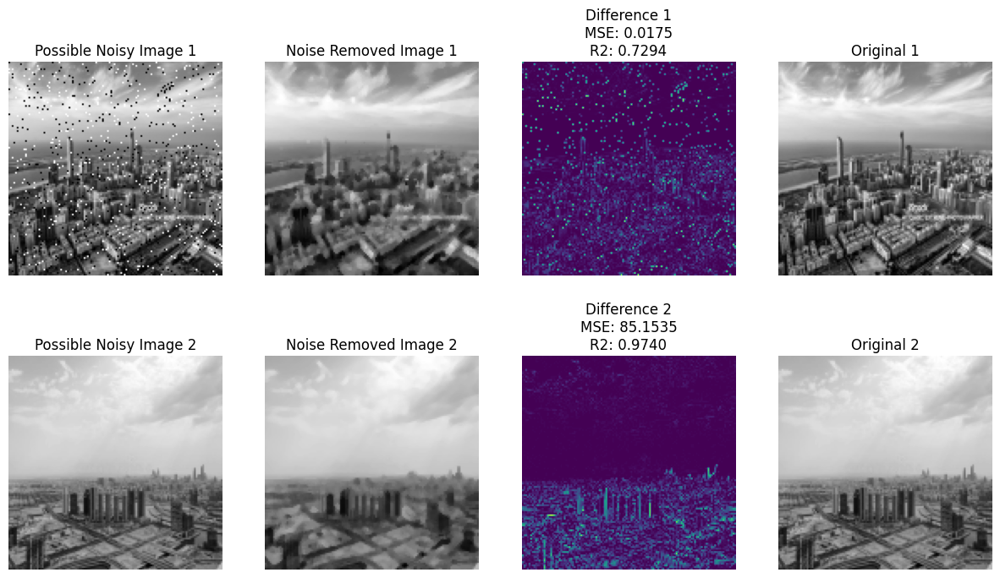

((8727, 128, 128), (8727,))

In [34]:
new_grayscale_images = compare_image_difference(grayscale_images,labels,cities,noisy_images,not_noisy_images)
new_grayscale_images /= 255

new_grayscale_images.shape, labels.shape

<font color = 'steelblue' size = 4> **The noise-free images consistently achieve an R-squared score above 0.8 after applying the median filter, indicating minimal discrepancy between the original and filtered versions. Conversely, the noisy images exhibit higher differences post-noise removal. Despite this, the median filter effectively reduces noise in the images, making them suitable for use. Hence, we opt to utilize the median-filtered images.** </font> 

***
<font color = 'steelblue' size = 4> **The process of loading the images into memory, resizing, applying noise takes up a lot of memory and time. To save this time, we can stored the processed images in a shelve object, and reload it when needed. The code below does exactly that** </font> 

In [3]:
import shelve

# save pre-computed cleaned data to save computation time
def save_cleaned_data(filename):

    data = shelve.open(filename)
    data['gray'] = new_grayscale_images
    data['color'] = rgb_images
    data['labels'] = labels
    data['num_classes'] = num_classes
    data.close()

def load_cleaned_data(filename):

    data = shelve.open(filename)
    new_grayscale_images = data['gray']
    rgb_images = data['color'] 
    labels = data['labels']
    num_classes = data['num_classes']
    data.close()
    return new_grayscale_images, rgb_images, labels, num_classes


##   <font color = 'skyblue' size = 6> **2.4 Feature Engineering** </font> 

In [9]:
new_grayscale_images, rgb_images, labels, num_classes = load_cleaned_data("small")

In [12]:
num_imgs = new_grayscale_images.shape[0]

<font color = 'steelblue'> <b> Get the histogram values of the greyscale images </b> </font>

In [10]:
def get_histogram_values(img, nbins=30):

    hist, bins = np.histogram(img, nbins, (0., 1.))

    return hist

In [13]:

hist_features = np.zeros((num_imgs, 30))

for idx, img in tqdm(enumerate(new_grayscale_images)):
    hist_features[idx] = get_histogram_values(img, nbins=30)


8727it [00:01, 4718.17it/s]


<font color = 'steelblue'> <b> Get the Histogram of Gradient features in the images </b> </font>

In [14]:
from skimage.feature import hog

hogs = [hog(image, orientations=8, pixels_per_cell = (8, 8), cells_per_block = (3, 3), feature_vector=True) for image in tqdm(new_grayscale_images)]
hog_features = np.array(hogs)

100%|██████████| 8727/8727 [00:44<00:00, 197.67it/s]


<font color = 'steelblue'> <b>Get the SIFT features of the images</b> </font>

In [15]:
def get_sift_features(img, nfeatures, max_kp=30, only_length=False):

    sift = cv2.SIFT.create(nfeatures=nfeatures, contrastThreshold=0.004)

    img = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype('uint8') # type: ignore

    kp_tuple, desc_array = sift.detectAndCompute(img, None) # type: ignore

    # if only length must be found then return and ignore the rest of the function
    if only_length:
        return len(kp_tuple)

    if len(kp_tuple) >= max_kp:
        # only use first max_kp keypoints
        kp_tuple = kp_tuple[:max_kp]
        desc_array = desc_array[:max_kp]
    else:
        # fill until max_kp keypoints
        kp_tuple += kp_tuple[-1:] * (max_kp - len(kp_tuple))

        num_repeats = np.ones((desc_array.shape[0], ), dtype=np.int64)
        num_repeats[-1] += max_kp - desc_array.shape[0]

        desc_array = np.repeat(desc_array, num_repeats, axis=0)

    result = []
    for kp, desc in zip(kp_tuple, desc_array):
        result.append(np.concatenate( (np.array(kp.pt), desc) ))

    return np.array(result).flatten()

<font color = 'steelblue'> <b> We find the lengths of the keypoints and display them in a histogram. We then take the median length of keypoints and use that as the number of keypoints. </b></font>

In [22]:
num_imgs = new_grayscale_images.shape[0]

# create array to store the length of the keypoints
kp_lens = np.zeros((num_imgs, ))

# get the lengths so we know how many keypoints to use
for idx, img in tqdm(enumerate(new_grayscale_images)):
    kp_lens[idx] = get_sift_features(img, 50, only_length=True)

8727it [00:46, 188.77it/s]


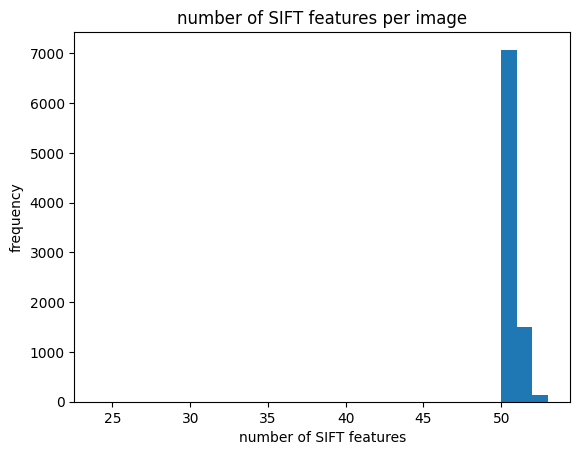

In [23]:
# plot the distribution of keypoints lengths
plt.hist(kp_lens, bins=int(np.max(kp_lens) - np.min(kp_lens)), 
         range=(float(np.min(kp_lens)), float(np.max(kp_lens))))
plt.title("number of SIFT features per image")
plt.xlabel("number of SIFT features")
plt.ylabel("frequency")
plt.show()

In [24]:
# use the median value of the lengths as the number of keypoints
num_kp = int(np.median(kp_lens))

print(f'number of keypoints used: {num_kp}')

# create np array to store keypoints
sift_features = np.zeros((num_imgs, 130 * num_kp))

for idx, img in tqdm(enumerate(new_grayscale_images)):
    sift_features[idx] = get_sift_features(img, 50, max_kp=num_kp)
    
sift_features.shape

number of keypoints used: 50


8727it [00:45, 192.64it/s]


(8727, 6500)

<font color = 'steelblue'> <b> Apply the Sobel filter to the greyscale images, flatten and store them</b> </font>

In [27]:
from skimage.filters import sobel

sobel_features = np.array([sobel(image) for image in new_grayscale_images])

# Flatten the sobel
sobel_features_flat = sobel_features.reshape(sobel_features.shape[0], 128*128)

<font color = 'steelblue'> <b> Apply the Canny filter to the greyscale images, flatten and store them</b> </font>

In [28]:
from skimage.feature import canny

canny_features = np.array([canny(image) for image in new_grayscale_images])

# Flatten the canny
canny_features_flat = canny_features.reshape(canny_features.shape[0], 128*128)

<font color = 'steelblue'><b> Extracting features from a CNN </b></font>

<font color = 'steelblue'><b> We will use a Convolutional Neural Network (CNN) to extract features from the raw image data, the initial design of the CNN is our iteration 1 CNN model seen in `QuAM_report.ipynb`

It takes in the raw grayscale images and uses 6 convolutional layers to extract features from the images. With 64 feature maps in the first 2 convolutional layers and 32 feature maps in the last 4, there will be 256 feature maps in total, the last 32 of which will be fed to 5 dense layers to learn a non-linear mapping between the extracted features and the classes.

There are pooling layers in between every two convolutional layer to compress the extracted features and keep the size of the extracted features small as this reduces the number of trainable parameters when passing to the dense layers and keeps the model simpler.

There are also dropout layers included to prevent overfitting the model as CNNs can be prone to overfitting with small amount of data.

The activation function for all of the convolutional and dense layers will be the Rectified Linear Unit (ReLU) as it has the advantages of being computationally efficient compared to other activation functions and solves the problem of vanishing gradients that affect functions such as sigmoid and tanh activations. The activation function on the output layer is the softmax function to obtain probabilistic outputs.

When compiling the model, we use sparse categorical cross-entropy as the loss function because we are dealing with a multi-class classification problem and are using the softmax function as the activation function for the output layer which cross-entropy loss works well with. We use the sparse version as our true labels are stored using label-encoding rather than one-hot encoding, but it functions the same as regular categorical cross-entropy.

We use the Adam optimiser to get the advantage of adaptive step size without needing to solve the heavy computation required for optimal adaptive step size.</b></font>

In [11]:
input_shape = (img_shape[0], img_shape[1], 1)

CNN_model = Sequential([Input(shape=input_shape),
                        Conv2D(64, kernel_size=(7, 7), activation='relu'),
                        Conv2D(64, kernel_size=(7, 7), activation='relu'),
                        Dropout(0.25),
                        MaxPool2D(),
                        Conv2D(32, kernel_size=(7, 7), activation='relu'),
                        Conv2D(32, kernel_size=(7, 7), activation='relu'),
                        Dropout(0.25),
                        MaxPool2D(),
                        Conv2D(32, kernel_size=(5, 5), activation='relu'),
                        Conv2D(32, kernel_size=(5, 5), activation='relu'),
                        MaxPool2D(),
                        Dropout(0.25),
                        Flatten(),
                        Dense(1024, activation='relu'),
                        Dropout(0.3),
                        Dense(512, activation='relu'),
                        Dense(256, activation='relu'),
                        Dropout(0.3),
                        Dense(128, activation='relu'),
                        Dense(num_classes, activation='softmax')
                        ])

CNN_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

<font color = 'steelblue'><b> Let's check the model summary </b></font>

In [12]:
CNN_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 122, 122, 64)   │         3,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 116, 116, 64)   │       200,768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 116, 116, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 58, 58, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 32)     │       100,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 46, 46, 32)     │        50,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 46, 46, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 23, 23, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 19, 19, 32)     │        25,632 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 15, 15, 32)     │        25,632 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 7, 7, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 7, 7, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1568)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2048)           │     3,213,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 18)             │         2,322 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,408,658 (24.45 MB)

 Trainable params: 6,408,658 (24.45 MB)

 Non-trainable params: 0 (0.00 B)

<font color='steelblue' size=3><b>To train the CNN we will first split the dataset into a train and test set. Because we don't have a large amount of examples, we will use a small amount of data for validation so that we can use most of the data for training the CNN.</b></font>

In [13]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(new_grayscale_images, labels, test_size=0.05, shuffle=True)

X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((8290, 128, 128), (437, 128, 128), (8290,), (437,))

<font color='steelblue' size=3><b>We use a batch size of 128 as opposed to large batch sizes to reduce the time taken needed to train the model along with 20 epochs so that the model can learn from the data and we provide the model with the test set to validate so that we can check its generalisability across epochs.</b></font>

In [14]:
num_validation = int(0.3 * X_test.shape[0])
batches = 128
num_epochs = 20

training = CNN_model.fit(X_train, Y_train,
                         batch_size=batches,
                         epochs=num_epochs,
                         validation_data=(X_test[:num_validation],
                                          Y_test[:num_validation]))

score = CNN_model.evaluate(X_test, Y_test, verbose=0)

print('Test score: ', score[0])
print('Test accuracy: ', score[1])

Epoch 1/20


2024-04-25 22:42:41.275386: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng11{k2=1,k3=0} for conv (f32[128,64,116,116]{3,2,1,0}, u8[0]{0}) custom-call(f32[128,64,122,122]{3,2,1,0}, f32[64,64,7,7]{3,2,1,0}, f32[64]{0}), window={size=7x7}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-04-25 22:42:41.834652: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.559403292s
Trying algorithm eng11{k2=1,k3=0} for conv (f32[128,64,116,116]{3,2,1,0}, u8[0]{0}) custom-call(f32[128,64,122,122]{3,2,1,0}, f32[64,64,7,7]{3,2,1,0}, f32[64]{0}), window={size=7x7}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2

64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step - accuracy: 0.0551 - loss: 2.9106

2024-04-25 22:44:20.742569: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng11{k2=1,k3=0} for conv (f32[98,64,116,116]{3,2,1,0}, u8[0]{0}) custom-call(f32[98,64,122,122]{3,2,1,0}, f32[64,64,7,7]{3,2,1,0}, f32[64]{0}), window={size=7x7}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-04-25 22:44:20.975532: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.23308249s
Trying algorithm eng11{k2=1,k3=0} for conv (f32[98,64,116,116]{3,2,1,0}, u8[0]{0}) custom-call(f32[98,64,122,122]{3,2,1,0}, f32[64,64,7,7]{3,2,1,0}, f32[64]{0}), window={size=7x7}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-0

65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.0551 - loss: 2.9105   

W0000 00:00:1714085117.685337     148 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


65/65 ━━━━━━━━━━━━━━━━━━━━ 173s 1s/step - accuracy: 0.0551 - loss: 2.9104 - val_accuracy: 0.0611 - val_loss: 2.8884
Epoch 2/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 337ms/step - accuracy: 0.0584 - loss: 2.8914 - val_accuracy: 0.0534 - val_loss: 2.8957
Epoch 3/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 338ms/step - accuracy: 0.0569 - loss: 2.8902 - val_accuracy: 0.0382 - val_loss: 2.8989
Epoch 4/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 339ms/step - accuracy: 0.0554 - loss: 2.8911 - val_accuracy: 0.0611 - val_loss: 2.8917
Epoch 5/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 341ms/step - accuracy: 0.0595 - loss: 40.8005 - val_accuracy: 0.0534 - val_loss: 13710.9287
Epoch 6/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 341ms/step - accuracy: 0.0567 - loss: 871.2939 - val_accuracy: 0.0534 - val_loss: 634.2735
Epoch 7/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 341ms/step - accuracy: 0.0584 - loss: 307.0118 - val_accuracy: 0.0382 - val_loss: 176.3484
Epoch 8/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 342ms/step - accuracy: 0.0530 - loss: 6.5303 - val_accu

W0000 00:00:1714085554.320320     148 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


Test score:  21.212190628051758
Test accuracy:  0.06178489699959755


W0000 00:00:1714085562.773560     148 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


<font color='steelblue' size=3><b> Now we will actually visualise the feature maps that the CNN learnt</b></font>

In [15]:
def show_learning_curves(learning_evolution, title=''):

    # list all data stored in the learning_evolution object
    print('Stored information:', [h for h in learning_evolution.history.keys()])

    # show evolution of accuracy
    plt.plot(learning_evolution.history['accuracy'])

    # show evolution of cross-validated accuracy
    if 'val_accuracy' in learning_evolution.history:
        plt.plot(learning_evolution.history['val_accuracy'])

    plt.title(title + 'Model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')

    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

    # show evolution of loss
    plt.plot(learning_evolution.history['loss'])
    
     # show evolution of cross-validated loss
    if 'val_accuracy' in learning_evolution.history:
        plt.plot(learning_evolution.history['val_loss'])

    plt.title(title + 'Model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

Stored information: ['accuracy', 'loss', 'val_accuracy', 'val_loss']


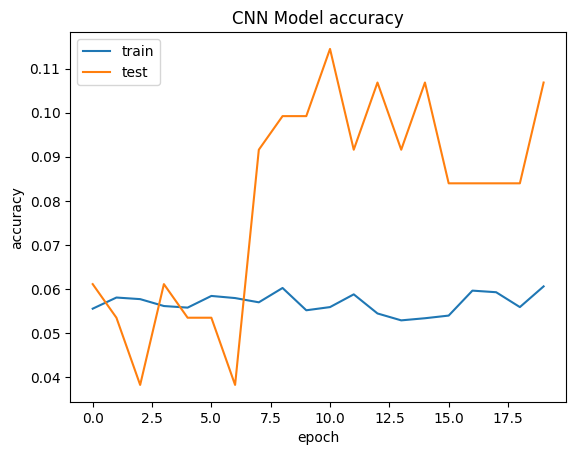

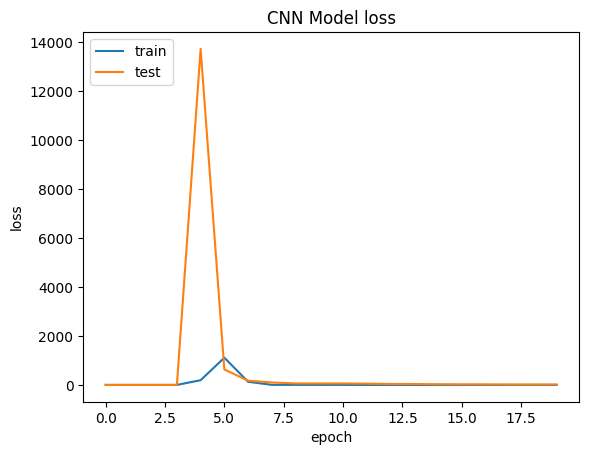

In [16]:
show_learning_curves(training, 'CNN ')

<font color='steelblue' size=3><b>In terms of accuracy, the model clearly doesn't seem to be learning anything as the training accuracy hovers around 6% and test accuracy seems to be very erratic. It is clear that something has gone very wrong as the model test loss seems to spike abruptly for one epoch, similar for train loss but with a lower spike.</b></font>

<font color='steelblue' size=3><b>Now we will go on to view the feature maps learnt by the model, though the training data suggests that they do not actually extract any features</b></font>

In [17]:
from keras.models import Model

def display_activation(activations, activation_index, ncols=5, size=(12, 12), reshape=None):

    activation = activations[activation_index]

    print('Shape of layer: ', activation.shape)

    if len(activation.shape) > 2:
        total_fmaps = activation.shape[-1] # the last axis of the array
        nrows = int(np.ceil(total_fmaps / ncols))
    else:
        total_fmaps = 1
        nrows,ncols = (1,1)

    feature_map=0

    if (ncols, nrows) == (1,1):
        plt.yticks([], [])
        plt.xticks(fontsize=6)
        if reshape == None:
            plt.imshow(activation[0].reshape(-1,1).T)
        else:
            plt.imshow(activation[0].reshape(reshape).T)
        plt.show()
        return

    fig = plt.figure(figsize=size)
    fig.subplots_adjust(hspace=0.23, wspace=0.22)

    for row in range(nrows):
        for col in range(ncols):
            subplot = fig.add_subplot(nrows, ncols, feature_map+1)
            #subplot[row][col].imshow(activation[0, :, :, feature_map],
            #                         cmap='gray')
            #subplot[row][col].tick_params(labelsize = 3)
            subplot.imshow(activation[0, :, :, feature_map])# cmap='gray')
            subplot.tick_params(labelsize = 3)

            feature_map += 1
            if feature_map == total_fmaps:
                plt.show()
                return

<font color = 'steelblue'><b> Here we take a random sample image from the test set to see how the model performs on it </b></font>

In [18]:
layer_outputs = [layer.output for layer in CNN_model.layers]

layer_names = [layer.name.split('_')[0] for layer in CNN_model.layers]

activation_model = Model(inputs=CNN_model.layers[0].input, outputs=layer_outputs)

sample_idx = 1324
img_sample = new_grayscale_images[sample_idx].reshape((1, *input_shape))

activations = activation_model.predict(img_sample)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


<font color = 'steelblue'><b> Let's see our sample image and its associated label </b></font>

'label: 2'

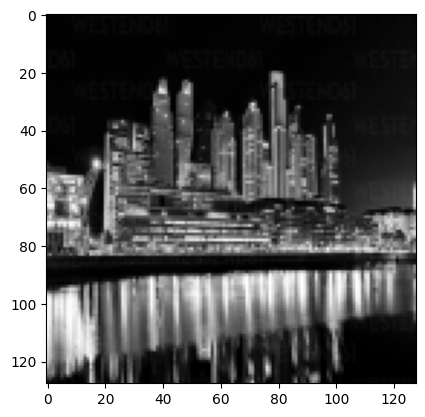

In [19]:
plt.imshow(new_grayscale_images[sample_idx], cmap='gray')
f'label: {labels[sample_idx]}'

<font color = 'steelblue'><b> Now lets see what the feature maps and the subsequent dense layers of this image look like </b></font>

Type of layer:  conv2d
Shape of layer:  (1, 122, 122, 64)


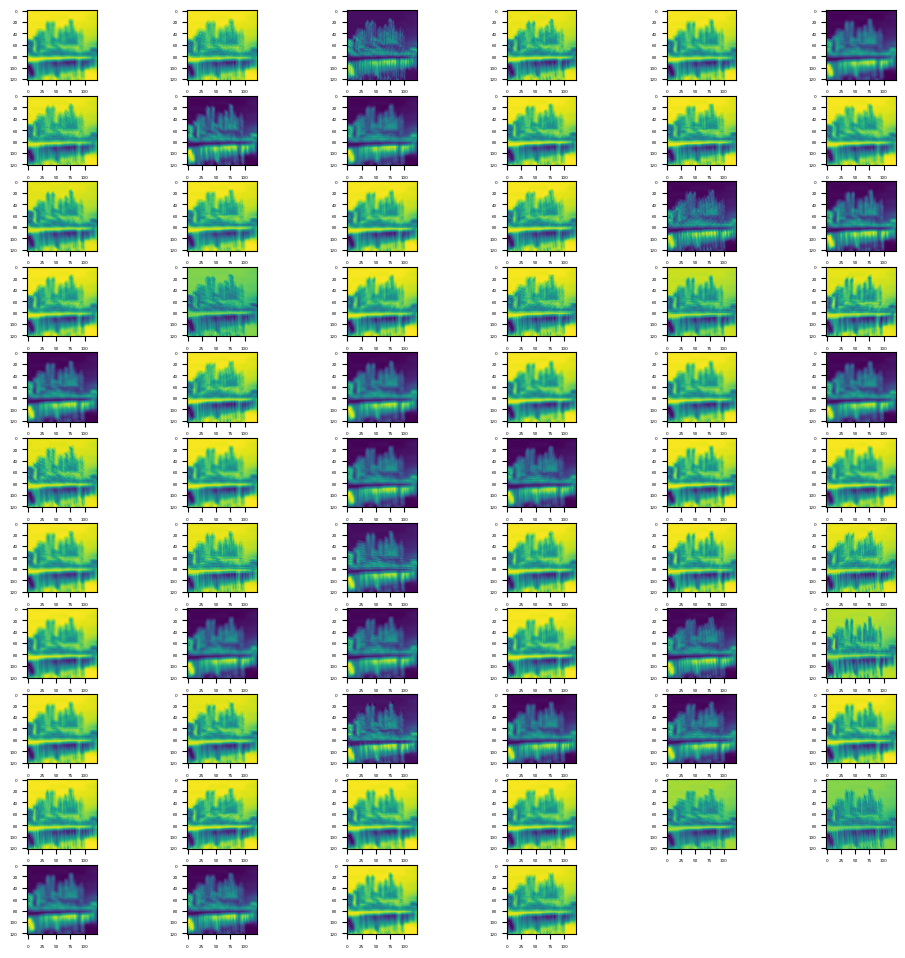

Type of layer:  conv2d
Shape of layer:  (1, 116, 116, 64)


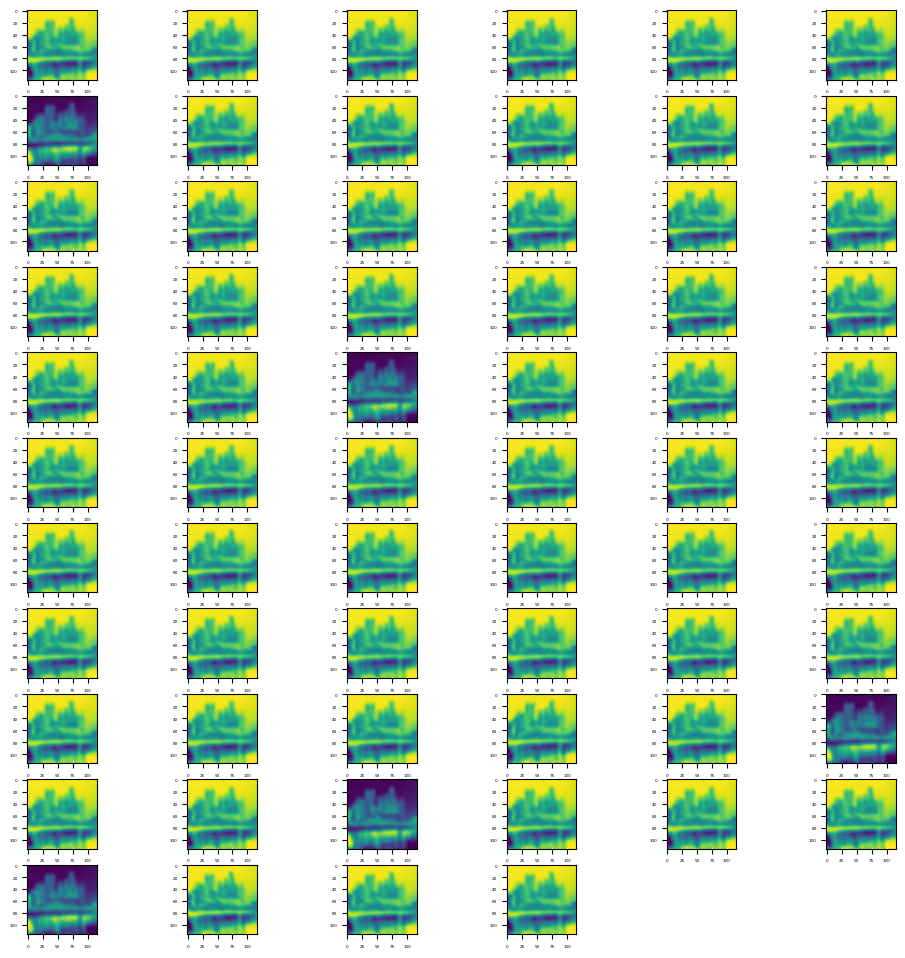

Type of layer:  dropout
Type of layer:  max
Type of layer:  conv2d
Shape of layer:  (1, 52, 52, 32)


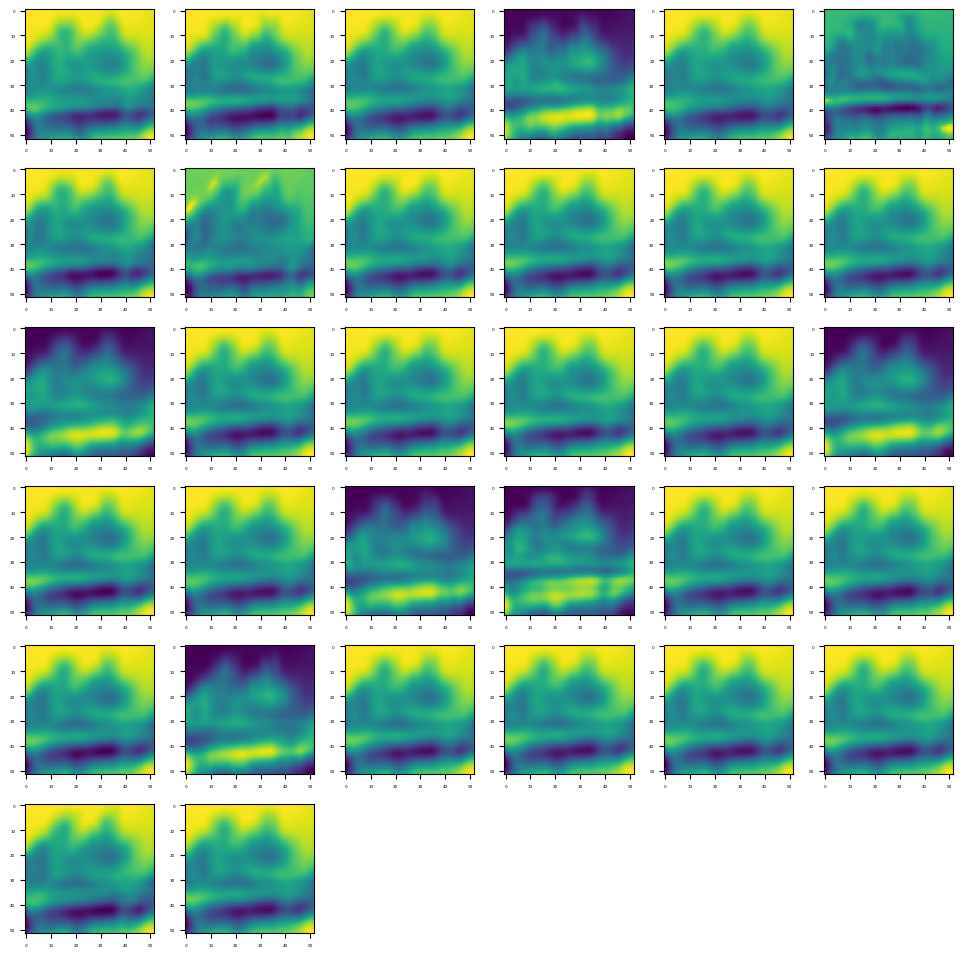

Type of layer:  conv2d
Shape of layer:  (1, 46, 46, 32)


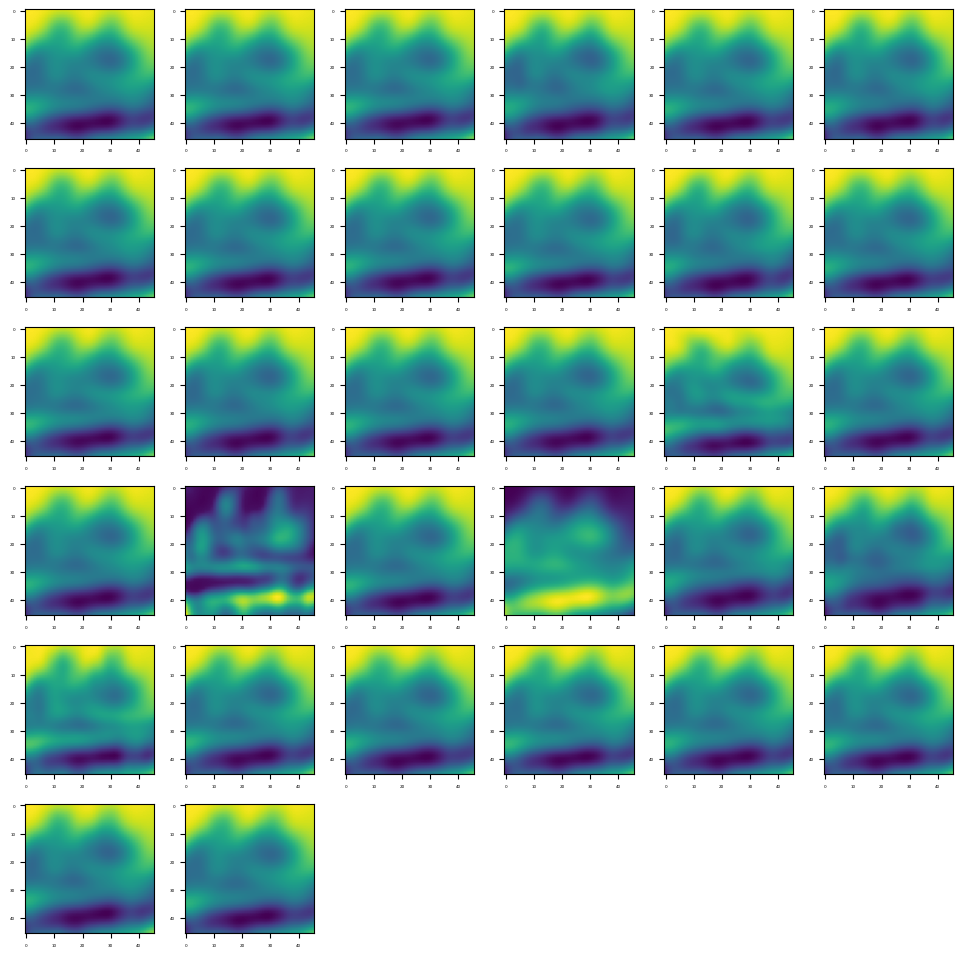

Type of layer:  dropout
Type of layer:  max
Type of layer:  conv2d
Shape of layer:  (1, 19, 19, 32)


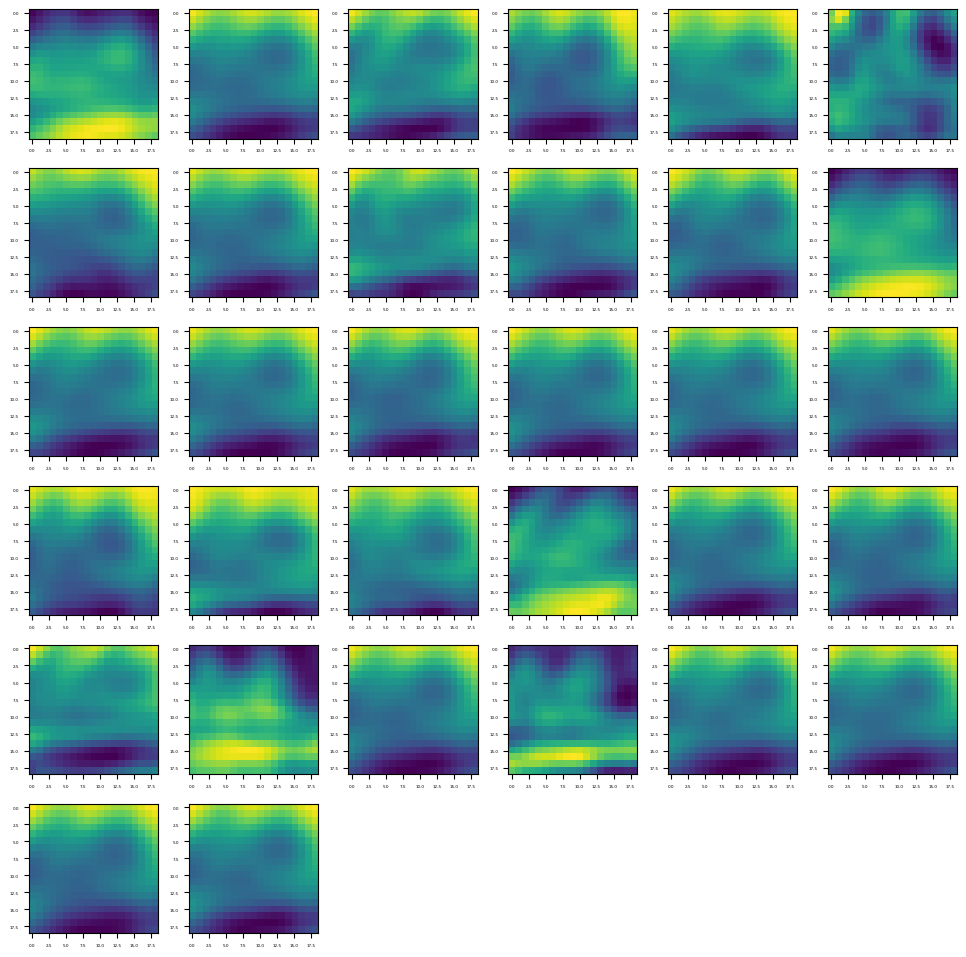

Type of layer:  conv2d
Shape of layer:  (1, 15, 15, 32)


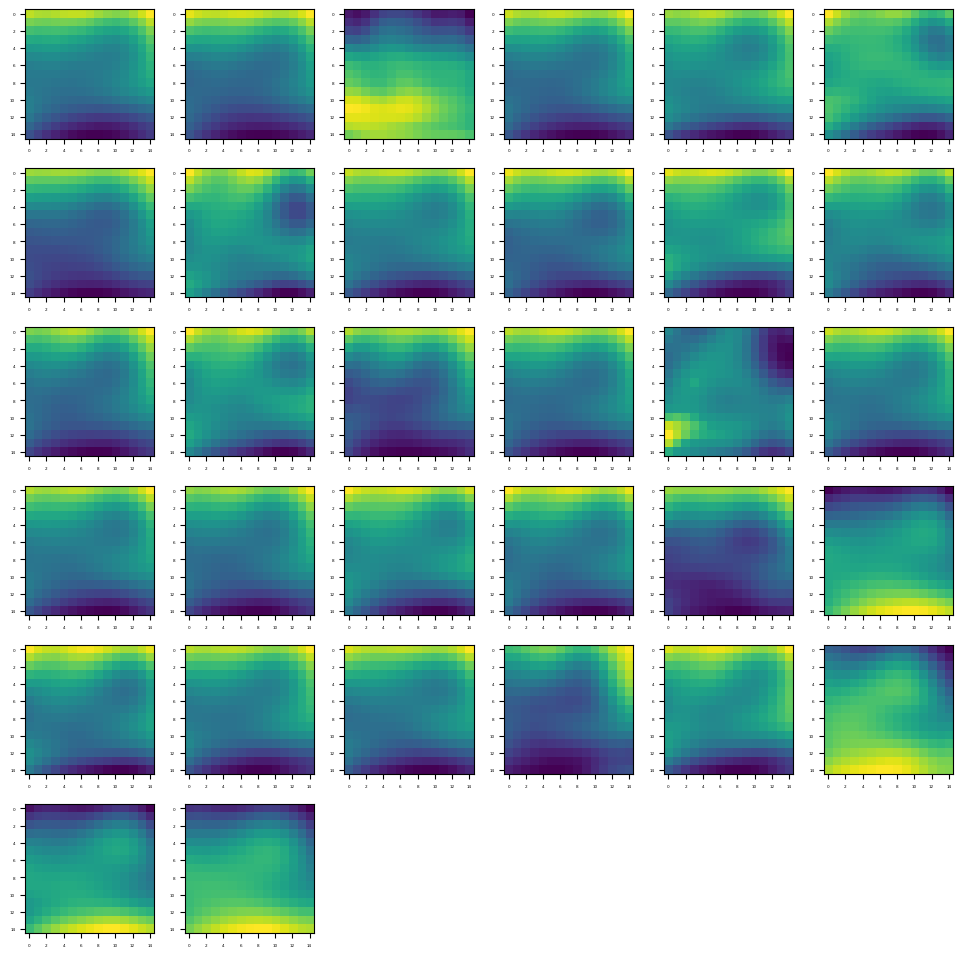

Type of layer:  max
Type of layer:  dropout
Type of layer:  flatten
Type of layer:  dense
Type of layer:  dense
Type of layer:  dropout
Type of layer:  dense
Type of layer:  dense
Type of layer:  dropout
Type of layer:  dense
Type of layer:  dense


In [20]:
for i in range(len(layer_names)):
    print('Type of layer: ', layer_names[i])
    if layer_names[i] == 'conv2d':
        display_activation(activations, i, 6)

<font color='steelblue' size=3><b>As we can see from the later feature maps, it does not seem to extract any features but most feature maps seem to mirror the general structure of the image.</b></font>

***
## D3: Model Training
***

## <font color = 'skyblue' size = 5>  **Goal: To classify images of 18 popular cities by country** </font>

<font color = 'steelblue' size = 3> **We will first do some simple setup before getting to the training** </font>


In [3]:
### SET TO FALSE IF NOT RUNNING ON KAGGLE
KAGGLE = True

In [4]:
import os
import skimage
from skimage import io,util,filters
from sklearn.metrics import mean_squared_error, r2_score
from skimage.color import rgb2gray
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
import re
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, Flatten, MaxPool2D, Input

## <font color = 'skyblue' size = 5>  **Loading the data** </font>

<font color='steelblue' size=3><b>To optimize loading time, the data from the previous task has been efficiently stored in a Python pickle object using Shelve. This approach significantly reduces the time required to load images.</b></font>

<font color='steelblue' size=3><b>The stored data is structured as a dictionary, with 'gray' and 'color' fields containing NumPy arrays representing grayscale and color images, respectively.</b></font>

In [5]:
import shelve

shelve_link = '/kaggle/input/images-of-major-capital-cities/small' if KAGGLE else 'small'
d = shelve.open(shelve_link)
print(list(d.keys()))
gray = d['gray']
color = d['color']
labels = d['labels']
num_classes = d['num_classes']
d.close()

['gray', 'color', 'labels', 'num_classes']


## <font color = 'skyblue'>  **Iteration 1** </font>

<font color='steelblue' size=3><b>There are several ideas we can try:</b></font>
<ol>
    <li><font color='steelblue' size=3><b>K-NN with the various image features</b></font></li>
    <li><font color='steelblue' size=3><b>Decision Tree with the various image features</b></font></li>
    <li><font color='steelblue' size=3><b>Bagging</b></font></li>
    <li><font color='steelblue' size=3><b>CNN</b></font></li>
</ol>

<font color='steelblue' size=3><b>For convenience, the features are re-generated here the same way they were in the dataset notebook.</b></font>


### <font color = 'steelblue'> **Model 1: K-NN** </font>

In [6]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics 
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV

def learn_kNN_classifier(features_data, targets, v=0):
    '''Set up a K-NN classifier and fits it to the given training data.
       Return: learned classifier.''' 
    
    classifier = KNeighborsClassifier(n_neighbors=5, 
                                      weights='uniform')
    parameters_grid = {'n_neighbors': [1, 2, 3, 5, 7, 10, 15] }
    estimator = GridSearchCV(classifier, parameters_grid, verbose=v, 
                             cv=StratifiedKFold(5, shuffle=True), n_jobs=-1)
    estimator.fit(features_data, targets)
    print('Best estimator: {}'.format(estimator.best_estimator_))
    print('Best cross-validated score: {:.3f}'.format(estimator.best_score_))
    print('Score on entire dataset: ', estimator.best_estimator_.score(features_data, targets))

    return estimator.cv_results_, estimator.best_estimator_

<font color='steelblue' size=3><b>This code utilizes GridSearch with 10-fold cross-validation. It iterates over different values of the 'neighbor' parameter, namely [1, 2, 3, 5, 7, 10, 15].</b></font>

#### K-NN with raw grayscale images

In [7]:
# Flattens the images
gray_flattened = gray.reshape(gray.shape[0], gray.shape[1] * gray.shape[2])

In [6]:
results, classifier = learn_kNN_classifier(gray_flattened, labels)

/opt/conda/lib/python3.10/site-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

  pid = os.fork()

/opt/conda/lib/python3.10/site-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

  pid = os.fork()


Best estimator: KNeighborsClassifier(n_neighbors=1)

Best cross-validated score: 0.244

Score on entire dataset:  0.9996562392574768


<font color='steelblue' size=3><b>While utilizing K-NN with raw grayscale images, the results may not be optimal, especially when GridSearch selects a neighbor value of 1. This performance could be attributed to the primitive nature of the features.</b></font>


#### K-NN Hog Features

In [9]:
from skimage.feature import hog

hogs = [hog(image, orientations=8, pixels_per_cell = (8, 8), cells_per_block = (3, 3), feature_vector=True) for image in tqdm(gray)]
hog_features = np.array(hogs)

100%|██████████| 8727/8727 [01:04<00:00, 134.43it/s]


In [8]:
results, classifier = learn_kNN_classifier(hog_features, labels)

Best estimator: KNeighborsClassifier(n_neighbors=1)

Best cross-validated score: 0.380

Score on entire dataset:  0.9996562392574768


<font color='steelblue' size=3><b>Although the selection of 1 neighbor by GridSearch is concerning, it signifies a significant improvement from using raw images alone.</b></font>


#### K-NN Sift Features

In [10]:
def get_sift_features(img, nfeatures, max_kp=30, only_length=False):

    sift = cv2.SIFT.create(nfeatures=nfeatures, contrastThreshold=0.004)

    img = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')

    kp_tuple, desc_array = sift.detectAndCompute(img, None)

    # if only length must be found then return and ignore the rest of the function
    if only_length:
        return len(kp_tuple)

    if len(kp_tuple) >= max_kp:
        # only use first max_kp keypoints
        kp_tuple = kp_tuple[:max_kp]
        desc_array = desc_array[:max_kp]
    else:
        # fill until max_kp keypoints
        kp_tuple += kp_tuple[-1:] * (max_kp - len(kp_tuple))

        num_repeats = np.ones((desc_array.shape[0], ), dtype=np.int64)
        num_repeats[-1] += max_kp - desc_array.shape[0]

        desc_array = np.repeat(desc_array, num_repeats, axis=0)

    result = []
    for kp, desc in zip(kp_tuple, desc_array):
        result.append(np.concatenate( (np.array(kp.pt), desc) ))

    return np.array(result).flatten()

In [ ]:
num_imgs = gray.shape[0]

# use the median number of keypoints found in data preperation
num_kp = 50

# create np array to store keypoints
sift_features = np.zeros((num_imgs, 130 * num_kp))

for idx, img in tqdm(enumerate(gray)):
    sift_features[idx] = get_sift_features(img, 50, max_kp=num_kp)

8727it [00:56, 155.38it/s]


In [51]:
results, classifier = learn_kNN_classifier(sift_features, labels, v=3)

Fitting 5 folds for each of 1 candidates, totalling 5 fits

Best estimator: KNeighborsClassifier(n_neighbors=1)

Best cross-validated score: 0.103

Score on entire dataset:  0.9996562392574768


<font color='steelblue' size=3><b>Due to its very poor performance, SIFT will be dropped in subsequent iterations.</b></font>

#### K-NN Histogram Of Values Features

Uses a histogram of grayscale values for each image

In [12]:
def get_histogram_values(img, nbins=100):

    hist, bins = np.histogram(img, nbins, (0., 1.))

    return hist

In [13]:
hist_features = np.zeros((len(gray), 30))

for idx, img in tqdm(enumerate(gray)):
    hist_features[idx] = get_histogram_values(img, nbins=30)

8727it [00:02, 2928.36it/s]


In [43]:
results, classifier = learn_kNN_classifier(hist_features, labels)

Best estimator: KNeighborsClassifier(n_neighbors=1)

Best cross-validated score: 0.194

Score on entire dataset:  0.710438867881288


<font color='steelblue' size=3><b>Since it performed worse than raw grayscale images, perhaps increasing the bin size could lead to better results?</b></font>


In [22]:
hist_features = np.zeros((len(gray), 5000))

for idx, img in tqdm(enumerate(gray)):
    hist_features[idx] = get_histogram_values(img, nbins=5000)

8727it [00:03, 2398.80it/s]


In [45]:
results, classifier = learn_kNN_classifier(hist_features, labels)

Best estimator: KNeighborsClassifier(n_neighbors=1)

Best cross-validated score: 0.238

Score on entire dataset:  0.9996562392574768


<font color='steelblue' size=3><b>Although an improvement, the performance is still not optimal.</b></font>


#### K-NN Sobel

In [33]:
from skimage.filters import sobel

sobel_features = np.array([sobel(image) for image in gray])

# Flatten the sobel
sobel_features_flat = sobel_features.reshape(sobel_features.shape[0], 128*128)

In [16]:
results, classifier = learn_kNN_classifier(sobel_features_flat, labels)

Best estimator: KNeighborsClassifier(n_neighbors=1)

Best cross-validated score: 0.223

Score on entire dataset:  0.9996562392574768


<font color='steelblue' size=3><b>Not too bad; it could potentially be considered for use in future iterations.</b></font>


#### K-NN with Canny

In [34]:
from skimage.feature import canny

canny_features = np.array([canny(image) for image in gray])

# Flatten the canny
canny_features_flat = canny_features.reshape(canny_features.shape[0], 128*128)

In [18]:
results, classifier = learn_kNN_classifier(canny_features_flat, labels)

Best estimator: KNeighborsClassifier(n_neighbors=1)

Best cross-validated score: 0.158

Score on entire dataset:  0.710438867881288


<font color='steelblue' size=3><b>With its poor performance, it will be dropped in future iterations.</b></font>

***
<font color='steelblue' size=3><b>None of the above models yielded significant results. The highest accuracy reached was 0.38 with HOG features and a K-NN using 1 neighbor. This indicates a need for either improved feature extraction or the exploration of alternative classifier methods.</b></font>


### <font color = 'steelblue'> **Model 2: Decision Trees** </font>

In [19]:
from sklearn.tree import DecisionTreeClassifier

def learn_DT_classifier(features_data, targets, v=3):
    
    classifier = DecisionTreeClassifier(criterion='gini')
    parameters_grid = {'max_depth': [25, 50, 100] }
    estimator = GridSearchCV(classifier, parameters_grid, verbose=v, 
                             cv=StratifiedKFold(3, shuffle=True), n_jobs=-1)
    estimator.fit(features_data, targets)
    print('Best estimator: {}'.format(estimator.best_estimator_))
    print('Best parameters: ', estimator.best_params_)
    print('Best cross-validated score: {:.3f}'.format(estimator.best_score_))
    print('Score on entire dataset: ', estimator.best_estimator_.score(features_data, targets))

    return estimator.cv_results_, estimator.best_estimator_

<font color='steelblue' size=3><b>The code above employs GridSearch to determine the optimal parameters, focusing on the maximum depth of the decision tree.</b></font>

<font color='steelblue' size=3><b>Criterion gini is used to minimize computing time</b></font>

#### Decision Tree with raw grayscale

In [30]:
results, classifier = learn_DT_classifier(gray_flattened, labels)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


/opt/conda/lib/python3.10/site-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


[CV 3/3] END ......................max_depth=25;, score=0.123 total time= 4.2min
[CV 1/3] END .....................max_depth=100;, score=0.150 total time= 4.5min
[CV 2/3] END ......................max_depth=25;, score=0.145 total time= 4.1min
[CV 3/3] END ......................max_depth=50;, score=0.146 total time= 4.8min
[CV 1/3] END ......................max_depth=50;, score=0.153 total time= 4.5min
[CV 2/3] END .....................max_depth=100;, score=0.143 total time= 4.5min
Best estimator: DecisionTreeClassifier(max_depth=50)
Best parameters:  {'max_depth': 50}
Best cross-validated score: 0.149
Score on entire dataset:  0.9987395439440816
[CV 1/3] END ......................max_depth=25;, score=0.140 total time= 4.0min
[CV 2/3] END ......................max_depth=50;, score=0.147 total time= 4.7min
[CV 3/3] END .....................max_depth=100;, score=0.142 total time= 3.5min


#### Decision Tree with Hog Features

In [29]:
results, classifier = learn_DT_classifier(hog_features, labels)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


/opt/conda/lib/python3.10/site-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


[CV 1/3] END ......................max_depth=25;, score=0.117 total time= 5.2min
[CV 2/3] END ......................max_depth=50;, score=0.132 total time= 6.3min
[CV 2/3] END ......................max_depth=25;, score=0.116 total time= 5.5min
[CV 1/3] END .....................max_depth=100;, score=0.116 total time= 6.1min
[CV 1/3] END ......................max_depth=50;, score=0.118 total time= 6.0min
[CV 2/3] END .....................max_depth=100;, score=0.129 total time= 6.1min
[CV 3/3] END ......................max_depth=25;, score=0.118 total time= 5.4min
[CV 3/3] END ......................max_depth=50;, score=0.125 total time= 6.0min
[CV 3/3] END .....................max_depth=100;, score=0.131 total time= 4.2min
Best estimator: DecisionTreeClassifier(max_depth=100)
Best parameters:  {'max_depth': 100}
Best cross-validated score: 0.125
Score on entire dataset:  0.9996562392574768


#### Decision Tree Sift Features

In [31]:
results, classifier = learn_DT_classifier(sift_features, labels)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


/opt/conda/lib/python3.10/site-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


Best estimator: DecisionTreeClassifier(max_depth=50)
Best parameters:  {'max_depth': 50}
Best cross-validated score: 0.078
Score on entire dataset:  0.9880829609258622


#### Decision Tree Histogram Of Values Features

In [24]:
results, classifier = learn_DT_classifier(hist_features, labels)

Fitting 3 folds for each of 3 candidates, totalling 9 fits
Best estimator: DecisionTreeClassifier(max_depth=100)
Best parameters:  {'max_depth': 100}
Best cross-validated score: 0.130
Score on entire dataset:  0.9996562392574768


#### Decision with Tree Sobel

In [35]:
results, classifier = learn_DT_classifier(sobel_features_flat, labels)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


/opt/conda/lib/python3.10/site-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


[CV 3/3] END ......................max_depth=25;, score=0.116 total time= 5.9min
[CV 2/3] END ......................max_depth=50;, score=0.121 total time= 7.4min
[CV 1/3] END ......................max_depth=50;, score=0.115 total time= 8.7min
[CV 2/3] END .....................max_depth=100;, score=0.126 total time= 7.3min
[CV 1/3] END ......................max_depth=25;, score=0.097 total time= 6.2min
[CV 1/3] END .....................max_depth=100;, score=0.118 total time=10.0min
[CV 2/3] END ......................max_depth=25;, score=0.103 total time= 6.0min
[CV 3/3] END ......................max_depth=50;, score=0.131 total time= 7.3min
[CV 3/3] END .....................max_depth=100;, score=0.130 total time= 5.7min
Best estimator: DecisionTreeClassifier(max_depth=100)
Best parameters:  {'max_depth': 100}
Best cross-validated score: 0.125
Score on entire dataset:  0.983155723616363


#### Decision Tree with Canny

In [36]:
results, classifier = learn_DT_classifier(sobel_features_flat, labels)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


/opt/conda/lib/python3.10/site-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


[CV 1/3] END ......................max_depth=25;, score=0.095 total time= 6.1min
[CV 3/3] END ......................max_depth=50;, score=0.129 total time= 7.7min
[CV 3/3] END ......................max_depth=25;, score=0.111 total time= 6.2min
[CV 1/3] END .....................max_depth=100;, score=0.109 total time= 9.0min
[CV 1/3] END ......................max_depth=50;, score=0.112 total time= 8.4min
[CV 2/3] END .....................max_depth=100;, score=0.125 total time= 7.0min
[CV 2/3] END ......................max_depth=25;, score=0.106 total time= 6.0min
[CV 2/3] END ......................max_depth=50;, score=0.125 total time= 7.2min
[CV 3/3] END .....................max_depth=100;, score=0.127 total time= 5.9min
Best estimator: DecisionTreeClassifier(max_depth=50)
Best parameters:  {'max_depth': 50}
Best cross-validated score: 0.122
Score on entire dataset:  0.9091325770596997


<font color='steelblue' size=3><b>The entire decision trees took an extremely long time to run. Certain cells took 30-50 minutes to compute and yielded testing set accuracies ranging from 0.1 to 0.2. Consequently, simple decision trees will not be considered for future use.</b></font>


### <font color = 'steelblue'> **Model 3: Bagging** </font>

<font color='steelblue' size=3><b>We'll explore bagging with k-NN.</b></font>


In [14]:
from sklearn.ensemble import BaggingClassifier

def learn_baggin_classifier(features_data, targets, v=0):
    
    classifier = BaggingClassifier(n_estimators=10)
    parameters_grid = {'estimator': 
                       [KNeighborsClassifier(n_neighbors=1, weights='uniform'),
                       KNeighborsClassifier(n_neighbors=2, weights='uniform'),
                       KNeighborsClassifier(n_neighbors=5, weights='uniform')] }
    
    estimator = GridSearchCV(classifier, parameters_grid, verbose=v, 
                             cv=StratifiedKFold(5, shuffle=True))
    estimator.fit(features_data, targets)
    print('Best estimator: {}'.format(estimator.best_estimator_))
    print('Best parameters: ', estimator.best_params_)
    print('Best cross-validated score: {:.3f}'.format(estimator.best_score_))
    print('Score on entire dataset: ', estimator.best_estimator_.score(features_data, targets))

    return estimator.cv_results_, estimator.best_estimator_

<font color='steelblue' size=3><b>Now, we'll experiment with bagging using k-NN with neighbors 1, 2, and 5. These neighbor values yielded the best results among the primitive k-NN models. Number of estimators is left at 10 for computational reasons</b></font>


#### Bagging with grayscale images

In [19]:
results, classifier = learn_baggin_classifier(gray_flattened, labels)

Fitting 5 folds for each of 1 candidates, totalling 5 fits

Best estimator: BaggingClassifier(estimator=KNeighborsClassifier(n_neighbors=1))

Best parameters:  {'estimator': KNeighborsClassifier(n_neighbors=1)}

Best cross-validated score: 0.229

Score on entire dataset:  0.9361750888048584


<font color='steelblue' size=3><b>This performance is notably lower compared to previous models.</b></font>

#### Bagging with HOG

In [20]:
results, classifier = learn_baggin_classifier(hog_features, labels)

Fitting 5 folds for each of 1 candidates, totalling 5 fits

Best estimator: BaggingClassifier(estimator=KNeighborsClassifier(n_neighbors=1))

Best parameters:  {'estimator': KNeighborsClassifier(n_neighbors=1)}

Best cross-validated score: 0.370

Score on entire dataset:  0.9431648905694969


<font color='steelblue' size=3><b>This perfomed worse than regular K-NN with hog. This could be due to number of estimators being low. However, increasing that increases the computation, and therefore time, needed to train the model</b></font>

#### Bagging with Histogram features

In [15]:
results, classifier = learn_baggin_classifier(hist_features, labels)

Best estimator: BaggingClassifier(estimator=KNeighborsClassifier(n_neighbors=1))

Best parameters:  {'estimator': KNeighborsClassifier(n_neighbors=1)}

Best cross-validated score: 0.218

Score on entire dataset:  0.932622894465452


<font color='steelblue' size=3><b>Again, perfomed worse than regular K-NN with this, probably for the same reasons</b></font>

#### Bagging with Sobel features

In [16]:
results, classifier = learn_baggin_classifier(sobel_features_flat, labels)

Best estimator: BaggingClassifier(estimator=KNeighborsClassifier(n_neighbors=1))

Best parameters:  {'estimator': KNeighborsClassifier(n_neighbors=1)}

Best cross-validated score: 0.099

Score on entire dataset:  0.9250601581299416


#### Bagging with Sift Features

In [17]:
results, classifier = learn_baggin_classifier(sift_features, labels)

Best estimator: BaggingClassifier(estimator=KNeighborsClassifier(n_neighbors=1))

Best parameters:  {'estimator': KNeighborsClassifier(n_neighbors=1)}

Best cross-validated score: 0.096

Score on entire dataset:  0.9220808983614072



<font color='steelblue' size=3><b>Bagging performed even worse for sift and sobel features</b></font>


<font color='steelblue' size=3><b>In conclusion, bagging did not significantly improve the results, suggesting it may not be optimal for this task. It is also plausible that the number of estimators is too low. Due to the computation time required for that, it will not be explored in subsequent iterations</b></font>

### <font color = 'steelblue'> **Model 4: CNN** </font>

<font color='steelblue' size=3><b>For iteration 1 we will use a CNN that takes in the raw grayscale images and uses 8 convolutional layers to extract features from the images. With 64 feature maps in the first 2 convolutional layers and 32 feature maps in the last 4, there will be 256 feature maps in total, the last 32 of which will be fed to 6 dense layers to learn a non-linear mapping between the extracted features and the classes.

There are pooling layers in between every two convolutional layer to compress the extracted features and keep the size of the extracted features small as this reduces the number of trainable parameters when passing to the dense layers and keeps the model simpler.

There are also dropout layers included to prevent overfitting the model as CNNs can be prone to overfitting with small amount of data.

The activation function for all of the convolutional and dense layers will be the Rectified Linear Unit (relu) as it has the advantages of being computationally efficient compared to other activation functions and solves the problem of vanishing gradients that affect functions such as sigmoid and tanh activations. The activation function on the output layer is the softmax function to obtain probabilistic outputs.

When compiling the model, we use sparse categorical cross-entropy as the loss function because we are dealing with a multi-class classification problem and are using the softmax function as the activation function for the output layer which cross-entropy loss works well with. We use the sparse version as our true labels are stored using label-encoding rather than one-hot encoding, but it functions the same as regular categorical cross-entropy.

We use the Adam optimiser to get the advantage of adaptive step size without needing to solve the heavy computation required for optimal adaptive step size.</b></font>

#### Setting up the CNN layers

In [ ]:
input_shape = (gray[0].shape[0], gray[0].shape[1], 1)

CNN_model = Sequential([Input(shape=input_shape),
                        Conv2D(64, kernel_size=(7, 7), activation='relu'),
                        Conv2D(64, kernel_size=(7, 7), activation='relu'),
                        Dropout(0.25),
                        MaxPool2D(),
                        Conv2D(32, kernel_size=(7, 7), activation='relu'),
                        Conv2D(32, kernel_size=(7, 7), activation='relu'),
                        Dropout(0.25),
                        MaxPool2D(),
                        Conv2D(32, kernel_size=(5, 5), activation='relu'),
                        Conv2D(32, kernel_size=(5, 5), activation='relu'),
                        MaxPool2D(),
                        Dropout(0.25),
                        Flatten(),
                        Dense(2048, activation='relu'),
                        Dense(1024, activation='relu'),
                        Dropout(0.3),
                        Dense(512, activation='relu'),
                        Dense(256, activation='relu'),
                        Dropout(0.3),
                        Dense(128, activation='relu'),
                        Dense(num_classes, activation='softmax')
                        ])

CNN_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

<font color='steelblue' size=3><b>We now check the model summary to see the structure of our model with the output shapes of every layer and the number of trainable parameters per layer.</b></font>

In [ ]:
CNN_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 122, 122, 64)   │         3,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 116, 116, 64)   │       200,768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 116, 116, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 58, 58, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 32)     │       100,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 46, 46, 32)     │        50,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 46, 46, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 23, 23, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 19, 19, 32)     │        25,632 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 15, 15, 32)     │        25,632 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 7, 7, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 7, 7, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1568)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2048)           │     3,213,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 18)             │         2,322 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,408,658 (24.45 MB)

 Trainable params: 6,408,658 (24.45 MB)

 Non-trainable params: 0 (0.00 B)

#### Training the CNN

<font color='steelblue' size=3><b>To train the CNN we will first split the dataset into a train and test set. Because we don't have a large amount of examples, we will use a small amount of data for validation so that we can use most of the data for training the CNN.</b></font>

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(gray, labels, test_size=0.05, shuffle=True)

X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((8290, 128, 128), (437, 128, 128), (8290,), (437,))

<font color='steelblue' size=3><b>We use a batch size of 128 as opposed to large batch sizes to reduce the time taken needed to train the model along with 100 epochs to ensure the model learns as much as it can with the provided data and we provide the model with the test set to validate so that we can check its generalisability across epochs.</b></font>

In [ ]:
num_validation = int(0.3 * X_test.shape[0])
batches = 128
num_epochs = 20

training = CNN_model.fit(X_train, Y_train,
                         batch_size=batches,
                         epochs=num_epochs,
                         validation_data=(X_test[:num_validation],
                                          Y_test[:num_validation]))

score = CNN_model.evaluate(X_test, Y_test, verbose=0)

print('Test score: ', score[0])
print('Test accuracy: ', score[1])

Epoch 1/20


2024-04-25 22:42:41.275386: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng11{k2=1,k3=0} for conv (f32[128,64,116,116]{3,2,1,0}, u8[0]{0}) custom-call(f32[128,64,122,122]{3,2,1,0}, f32[64,64,7,7]{3,2,1,0}, f32[64]{0}), window={size=7x7}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-04-25 22:42:41.834652: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.559403292s
Trying algorithm eng11{k2=1,k3=0} for conv (f32[128,64,116,116]{3,2,1,0}, u8[0]{0}) custom-call(f32[128,64,122,122]{3,2,1,0}, f32[64,64,7,7]{3,2,1,0}, f32[64]{0}), window={size=7x7}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2

64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step - accuracy: 0.0551 - loss: 2.9106

2024-04-25 22:44:20.742569: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng11{k2=1,k3=0} for conv (f32[98,64,116,116]{3,2,1,0}, u8[0]{0}) custom-call(f32[98,64,122,122]{3,2,1,0}, f32[64,64,7,7]{3,2,1,0}, f32[64]{0}), window={size=7x7}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-04-25 22:44:20.975532: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.23308249s
Trying algorithm eng11{k2=1,k3=0} for conv (f32[98,64,116,116]{3,2,1,0}, u8[0]{0}) custom-call(f32[98,64,122,122]{3,2,1,0}, f32[64,64,7,7]{3,2,1,0}, f32[64]{0}), window={size=7x7}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-0

65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.0551 - loss: 2.9105   

W0000 00:00:1714085117.685337     148 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


65/65 ━━━━━━━━━━━━━━━━━━━━ 173s 1s/step - accuracy: 0.0551 - loss: 2.9104 - val_accuracy: 0.0611 - val_loss: 2.8884
Epoch 2/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 337ms/step - accuracy: 0.0584 - loss: 2.8914 - val_accuracy: 0.0534 - val_loss: 2.8957
Epoch 3/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 338ms/step - accuracy: 0.0569 - loss: 2.8902 - val_accuracy: 0.0382 - val_loss: 2.8989
Epoch 4/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 339ms/step - accuracy: 0.0554 - loss: 2.8911 - val_accuracy: 0.0611 - val_loss: 2.8917
Epoch 5/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 341ms/step - accuracy: 0.0595 - loss: 40.8005 - val_accuracy: 0.0534 - val_loss: 13710.9287
Epoch 6/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 341ms/step - accuracy: 0.0567 - loss: 871.2939 - val_accuracy: 0.0534 - val_loss: 634.2735
Epoch 7/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 341ms/step - accuracy: 0.0584 - loss: 307.0118 - val_accuracy: 0.0382 - val_loss: 176.3484
Epoch 8/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 342ms/step - accuracy: 0.0530 - loss: 6.5303 - val_accu

W0000 00:00:1714085554.320320     148 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


Test score:  21.212190628051758
Test accuracy:  0.06178489699959755


W0000 00:00:1714085562.773560     148 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


<font color='steelblue' size=3><b>This accuracy is only slightly better than random suggesting that there is a problem with the structure of the CNN or the data used to train it. The reason for the low number of epochs is the fact that the model was not learning anything, so increasing the number of epochs would not help</b></font>

#### Visualizing CNN Outputs

<font color='steelblue' size=3><b>Visualising the training and outputs of the CNN can help us figure out which factor(s) may have been the problem. We will start by looking at the training data.</b></font>

In [ ]:
def show_learning_curves(learning_evolution, title=''):

    # list all data stored in the learning_evolution object
    print('Stored information:', [h for h in learning_evolution.history.keys()])

    # show evolution of accuracy
    plt.plot(learning_evolution.history['accuracy'])

    # show evolution of cross-validated accuracy
    if 'val_accuracy' in learning_evolution.history:
        plt.plot(learning_evolution.history['val_accuracy'])

    plt.title(title + 'Model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')

    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

    # show evolution of loss
    plt.plot(learning_evolution.history['loss'])
    
     # show evolution of cross-validated loss
    if 'val_accuracy' in learning_evolution.history:
        plt.plot(learning_evolution.history['val_loss'])

    plt.title(title + 'Model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

Stored information: ['accuracy', 'loss', 'val_accuracy', 'val_loss']


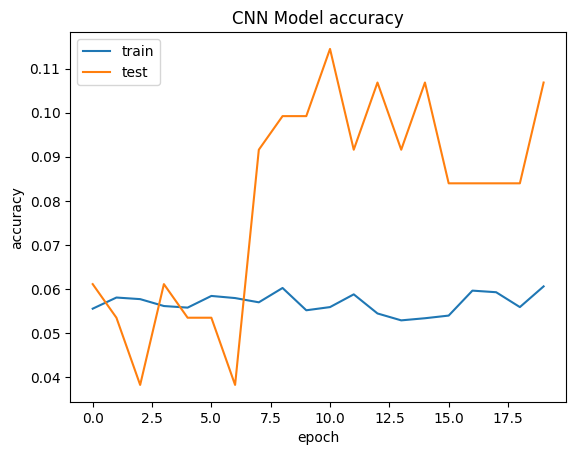

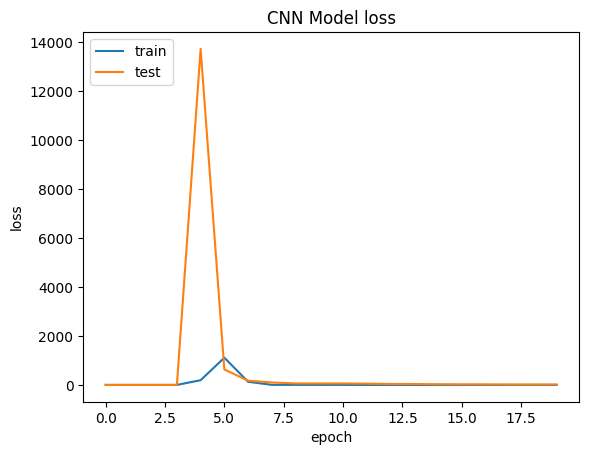

In [ ]:
show_learning_curves(training, 'CNN ')

<font color='steelblue' size=3><b>In terms of accuracy, the model clearly doesn't seem to be learning anything as the training accuracy hovers around 6% and test accuracy seems to be very erratic. It is clear that something has gone very wrong as the model test loss seems to spike abruptly for one epoch, similar for train loss but with a lower spike. This could be due to the quality of the data or the number of examples being too low for the complexity of the model. In subsequent iterations we will try to update the model structure to account for these findings.</b></font>

<font color='steelblue' size=3><b>Now we will go on to view the feature maps learnt by the model, though the training data suggests that they do not actually extract any features</b></font>

In [ ]:
from keras.models import Model

def display_activation(activations, activation_index, ncols=5, size=(12, 12), reshape=None):

    activation = activations[activation_index]

    print('Shape of layer: ', activation.shape)

    if len(activation.shape) > 2:
        total_fmaps = activation.shape[-1] # the last axis of the array
        nrows = int(np.ceil(total_fmaps / ncols))
    else:
        total_fmaps = 1
        nrows,ncols = (1,1)

    feature_map=0

    if (ncols, nrows) == (1,1):
        plt.yticks([], [])
        plt.xticks(fontsize=6)
        if reshape == None:
            plt.imshow(activation[0].reshape(-1,1).T)
        else:
            plt.imshow(activation[0].reshape(reshape).T)
        plt.show()
        return

    fig = plt.figure(figsize=size)
    fig.subplots_adjust(hspace=0.23, wspace=0.22)

    for row in range(nrows):
        for col in range(ncols):
            subplot = fig.add_subplot(nrows, ncols, feature_map+1)
            #subplot[row][col].imshow(activation[0, :, :, feature_map],
            #                         cmap='gray')
            #subplot[row][col].tick_params(labelsize = 3)
            subplot.imshow(activation[0, :, :, feature_map])# cmap='gray')
            subplot.tick_params(labelsize = 3)

            feature_map += 1
            if feature_map == total_fmaps:
                plt.show()
                return

In [ ]:
import random

layer_outputs = [layer.output for layer in CNN_model.layers]

layer_names = [layer.name.split('_')[0] for layer in CNN_model.layers]

activation_model = Model(inputs=CNN_model.layers[0].input, outputs=layer_outputs)

sample_idx = random.randint(0, X_test.shape[0] - 1)
img_sample = X_test[sample_idx].reshape((1, *input_shape))

activations = activation_model.predict(img_sample)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


'label: 2'

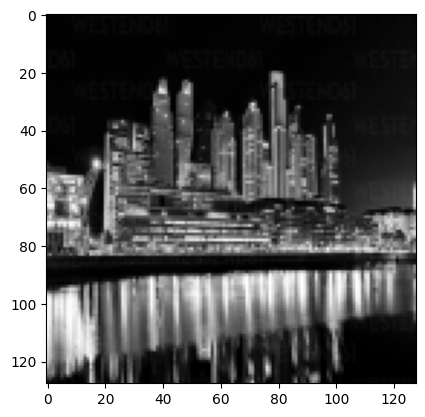

In [ ]:
plt.imshow(X_test[sample_idx])
f'label: {Y_test[sample_idx]}'

Type of layer:  conv2d
Shape of layer:  (1, 122, 122, 64)


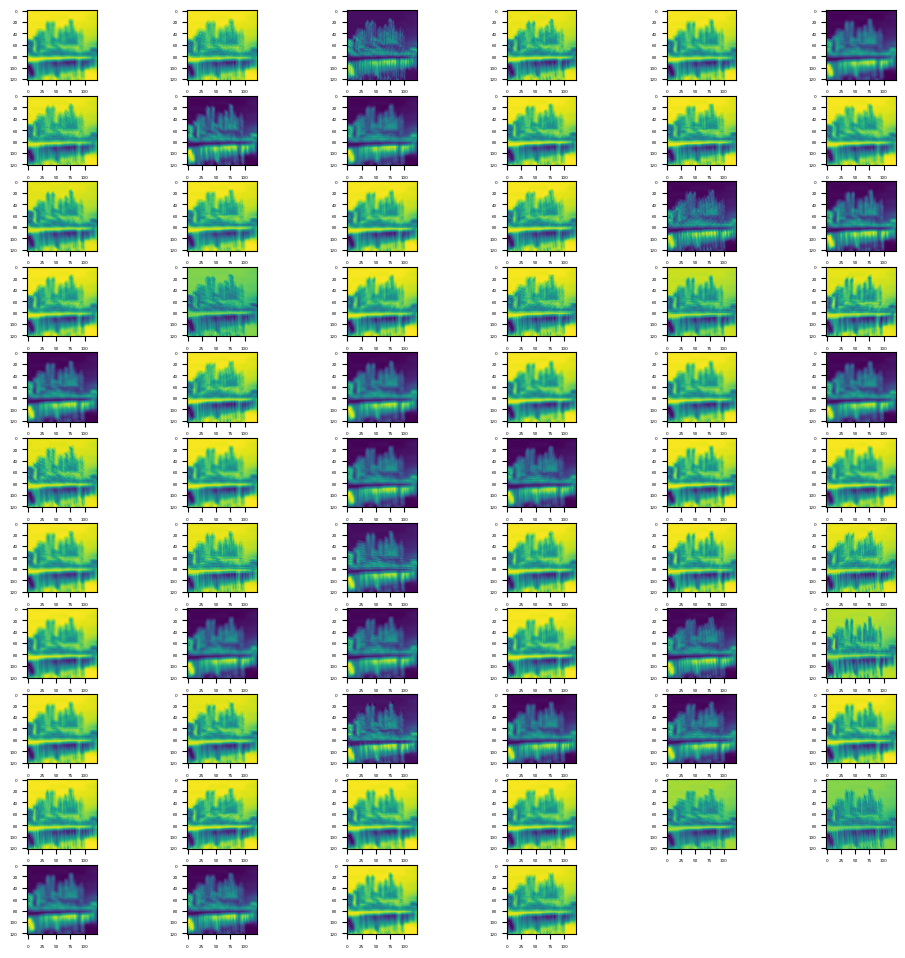

Type of layer:  conv2d
Shape of layer:  (1, 116, 116, 64)


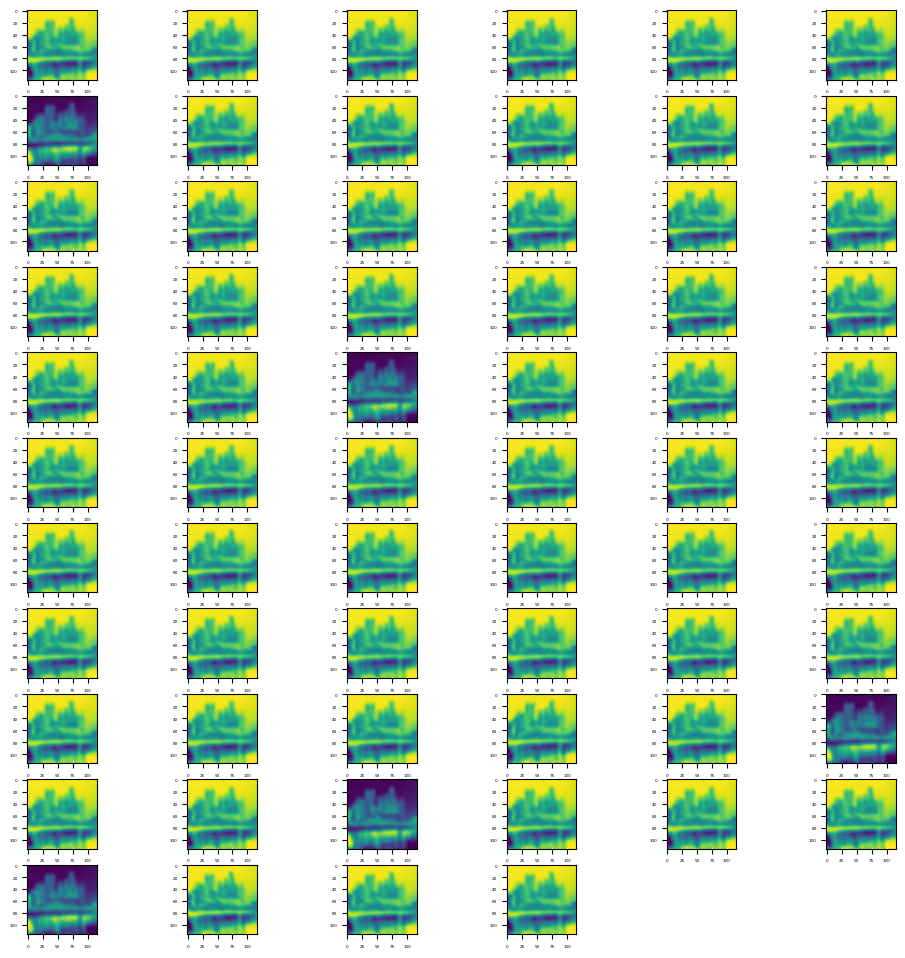

Type of layer:  dropout
Type of layer:  max
Type of layer:  conv2d
Shape of layer:  (1, 52, 52, 32)


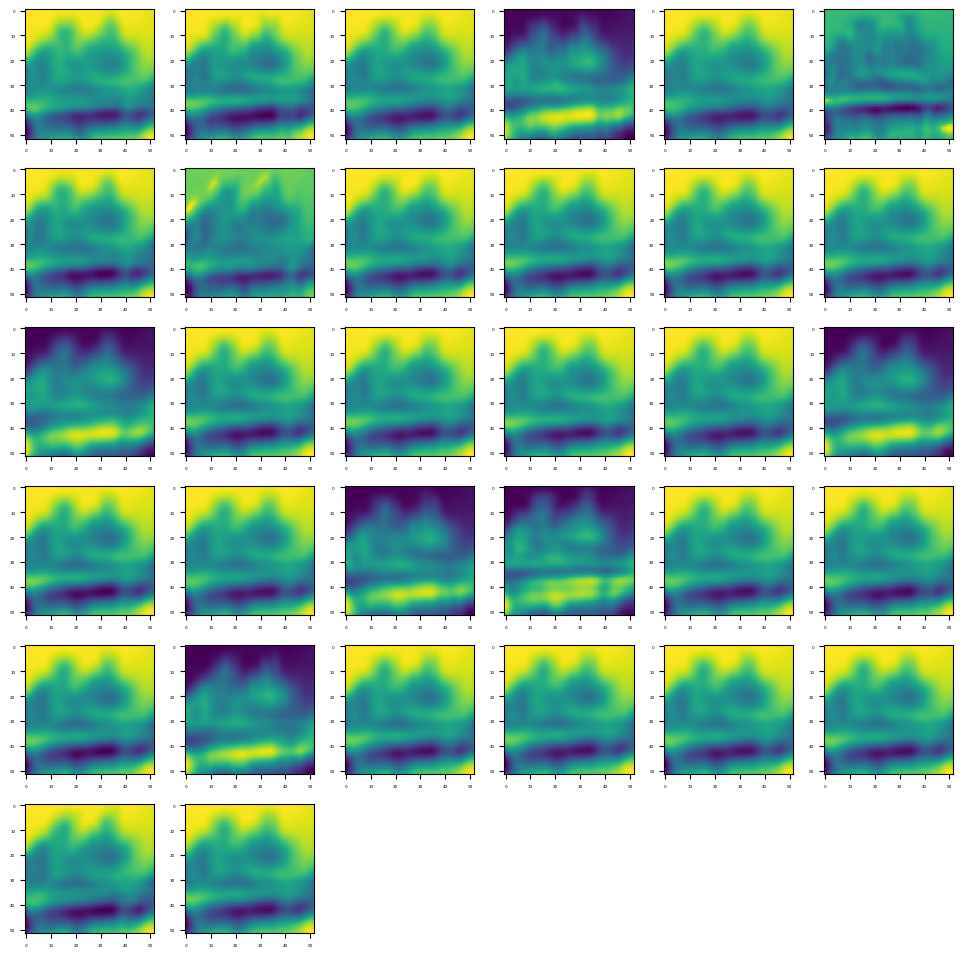

Type of layer:  conv2d
Shape of layer:  (1, 46, 46, 32)


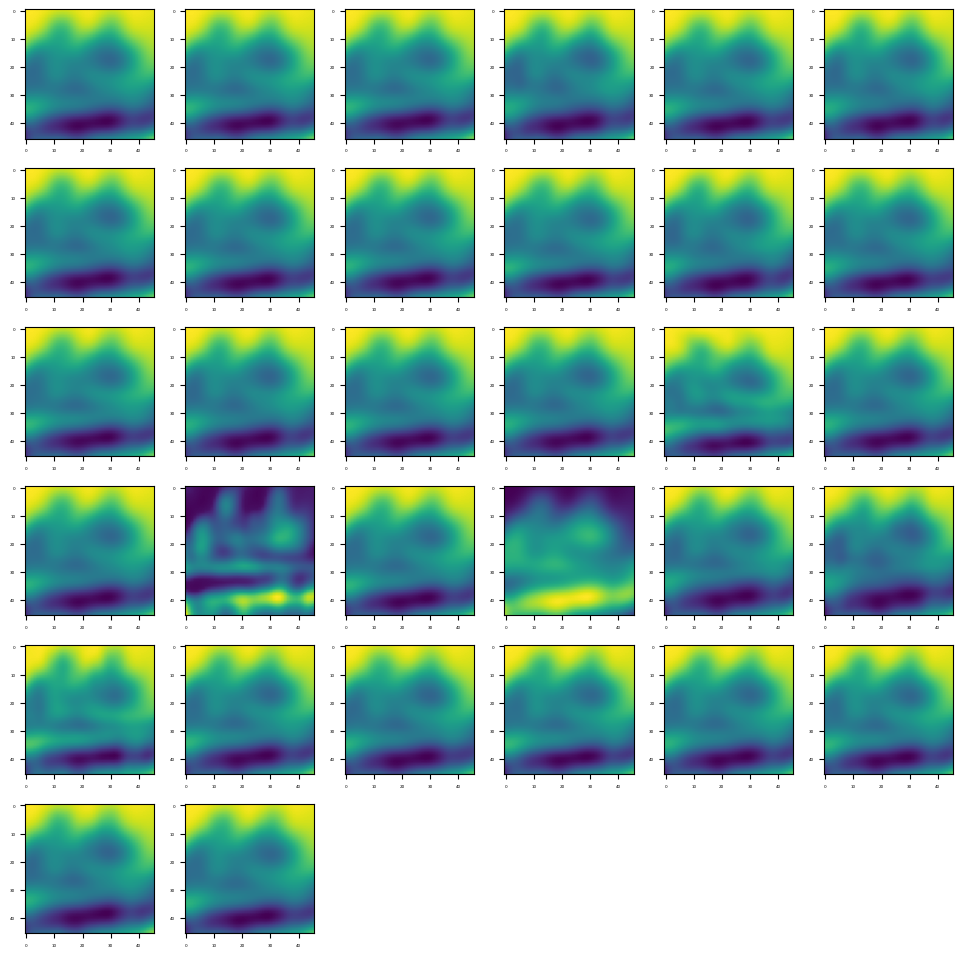

Type of layer:  dropout
Type of layer:  max
Type of layer:  conv2d
Shape of layer:  (1, 19, 19, 32)


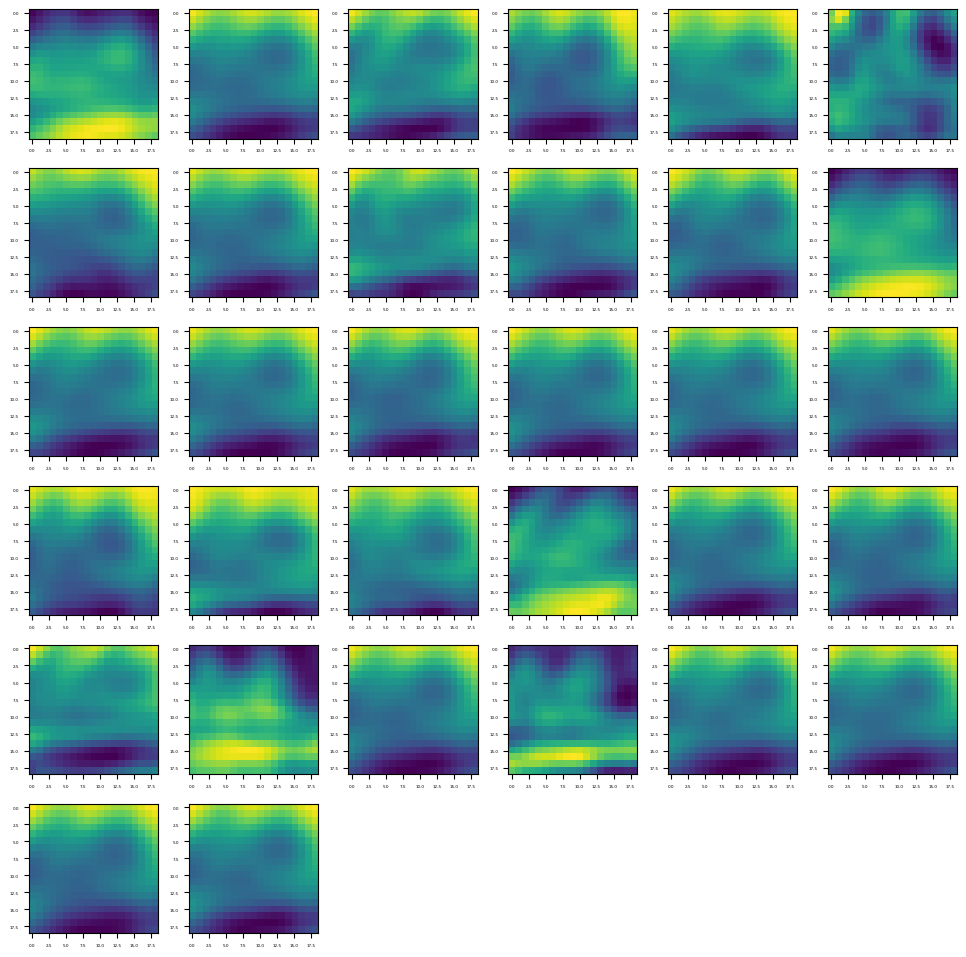

Type of layer:  conv2d
Shape of layer:  (1, 15, 15, 32)


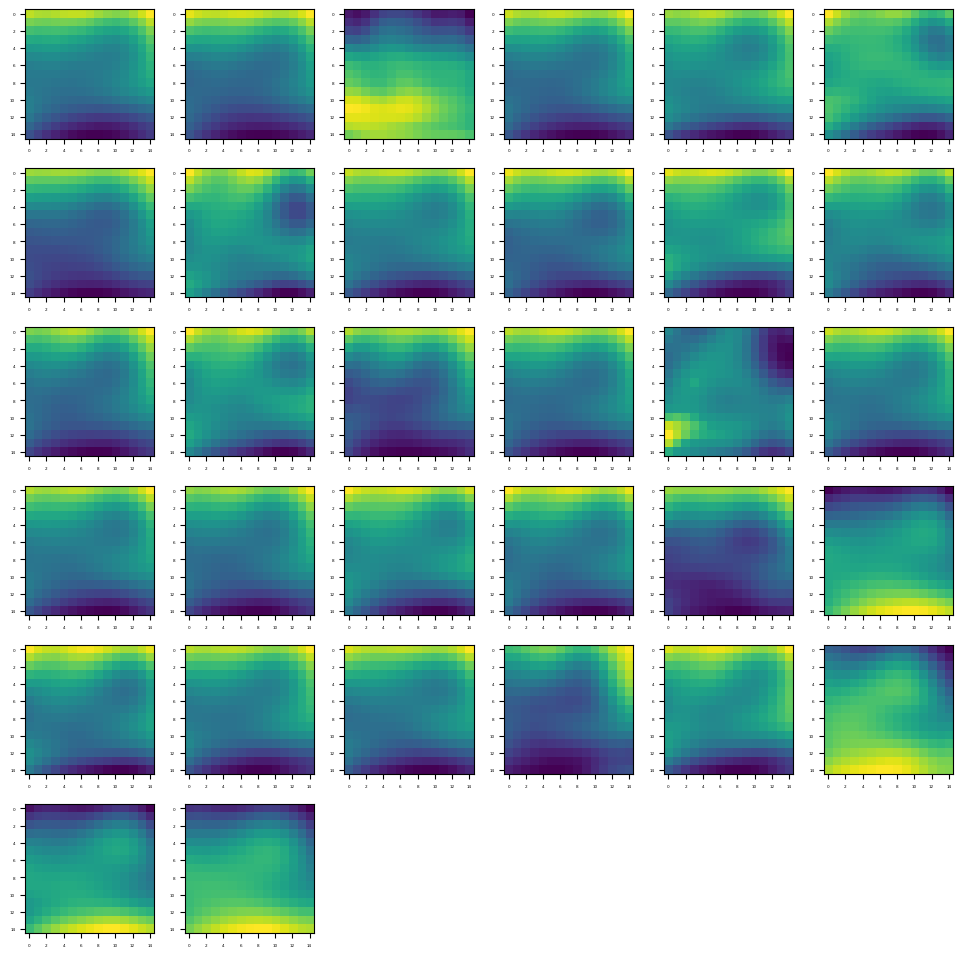

Type of layer:  max
Type of layer:  dropout
Type of layer:  flatten
Type of layer:  dense
Type of layer:  dense
Type of layer:  dropout
Type of layer:  dense
Type of layer:  dense
Type of layer:  dropout
Type of layer:  dense
Type of layer:  dense


In [ ]:
for i in range(len(layer_names)):
    print('Type of layer: ', layer_names[i])
    if layer_names[i] == 'conv2d':
        display_activation(activations, i, 6)

<font color='steelblue' size=3><b>As we can see from the later feature maps, it does not seem to extract any features but most feature maps seem to mirror the general structure of the image.</b></font>

<font color='steelblue' size=3><b>Now we will show the dense layers to check their activations</b></font>

Shape of layer:  (1, 2048)


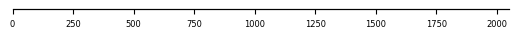

Shape of layer:  (1, 1024)


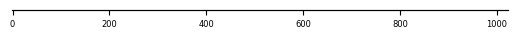

Shape of layer:  (1, 512)


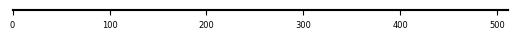

Shape of layer:  (1, 256)


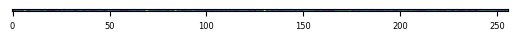

Shape of layer:  (1, 128)


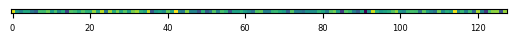

Shape of layer:  (1, 18)


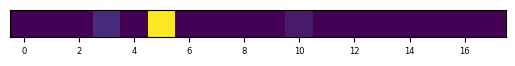

In [ ]:
for i in range(len(layer_names)):
    if layer_names[i] == 'dense':
        display_activation(activations, i, 1)

<font color='steelblue' size=3><b>The activations show that the model is confident in its answer. Yet, it is wrong! Confidence in wrong answers is not a good sign.</b></font>

### <font color = 'steelblue'> **Model 5: Support Vector Machines** </font>

<font color='steelblue' size=3><b>Next, we will explore Support Vector Machines (SVM) with linear, RBF, and polynomial kernels to determine which one yields the best performance.</b></font>


In [37]:
from sklearn import svm
from sklearn.model_selection import train_test_split

def learn_SVM_classifier(features_data, targets, kernel):
    
    X_train, X_test, Y_train, Y_test = train_test_split(features_data, targets, 
                                                        test_size=0.3, 
                                                        shuffle=True, stratify=targets)

    classifier = svm.SVC(kernel = kernel)
    
    classifier.fit(X_train, Y_train)
    print("Done training!")
    print('Training score:', classifier.score(X_train, Y_train))
    print('Testing score:', classifier.score(X_test, Y_test))

    return classifier

#### SVM on raw grayscale

In [41]:
# Linear
classifier = learn_SVM_classifier(gray_flattened, labels,'linear')

Training score: 0.7135080933963616

Testing score: 0.1981672394043528


In [42]:
# Poly
classifier = learn_SVM_classifier(gray_flattened, labels,'poly')

Training score: 0.6603638447213867

Testing score: 0.1764032073310424


In [38]:
# RBF
classifier = learn_SVM_classifier(gray_flattened, labels,'rbf')

Done training!
Training score: 0.30861165684348396
Testing score: 0.14165712103856434


<font color='steelblue' size=3>**Training the SVM took an exceptionally long time, indicating potential inefficiencies in the training process. Also, the accuracy achieved by the SVM model is unsatisfactory compared to other models**</font>

<font color='steelblue' size=3>**Hence, we will not train it on other features due to time constraints and mediocre results**</font>

### <font color = 'steelblue'> **Analysis** </font>

#### Solution and Justification:
We explored K-NN, Decision Trees, Bagging, CNN, and SVM for classifying city views. These models were chosen for their potential effectiveness with image data.

#### Solution Details:
1. **K-NN:** Used for its simplicity. Performance varied with different features.
   
2. **Decision Trees:** Showed promise but had long computation times.
   
3. **Bagging:** Did not significantly improve K-NN results.
   
4. **CNN:** Computationally expensive with grayscale images.
   
5. **SVM:** Long training times and unsatisfactory accuracy.

#### Lessons Learnt:
- K-NN accuracy varied with features.
- Decision Trees had long computation times.
- Bagging did not improve K-NN.
- CNN will need to be restructured and data may need to be changed.
- SVM had long training times and low accuracy.

Further experimentation needed for better accuracy.


## <font color = 'skyblue'>  **Iteration 2** </font>

<font color='steelblue' size=3><b>This iteration includes:</b></font>

<font color='steelblue' size=3 ><b>1. A K-NN with the best features combined from previous iterations.</b></font>

<font color='steelblue' size=3><b>2. Boosting decision stump (AdaBoost).</b></font>

<font color='steelblue' size=3><b>3. CNN with RGB images and improved structure.</b></font>


<font color='steelblue'>**We will not be using simple decision trees or random forest due to the already large computation time of decision tree and low accuracy.**</font>


### <font color = 'steelblue'> **Model 1: K-NN with combined features** </font>

<font color='steelblue'><b>From the previous iterations, the best features for a K-NN turned out to be raw grayscale, HOG, and Sobel. We will combine these features and pass them to the K-NN.</b></font>


In [16]:
combined_features = np.concatenate((gray_flattened, hog_features, sobel_features_flat), axis=1)

<font color='steelblue'><b>It would be better to normalize the features since they come from different feature extraction methods.</b></font>


In [17]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
combined_features_normalized = scaler.fit_transform(combined_features)

In [18]:
results, classifier = learn_kNN_classifier(combined_features_normalized, labels, v=1)

Fitting 5 folds for each of 2 candidates, totalling 10 fits


/opt/conda/lib/python3.10/site-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()
/opt/conda/lib/python3.10/site-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


Best estimator: KNeighborsClassifier(n_neighbors=1)
Best cross-validated score: 0.274
Score on entire dataset:  0.9996562392574768


<font color='steelblue'><b>This performed worse than standalone HOG features. Hence, not a great model</b></font>


### <font color = 'steelblue'> **Model 2: Boosting decision stump (AdaBoost)** </font>

***
<font color='steelblue' size=3>**Since decision trees did not yield any significant results, we will explore boosting with decision stump**</font>

In [22]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

def learn_boosting_classifier(features_data, targets, v=1):
    
    classifier = AdaBoostClassifier(n_estimators=50, learning_rate=1.0)
    parameters_grid = {'base_estimator': [DecisionTreeClassifier(max_depth=1)] }
    
    estimator = GridSearchCV(classifier, parameters_grid, verbose=v, 
                             cv=StratifiedKFold(5, shuffle=True))
    estimator.fit(features_data, targets)
    print('Best estimator: {}'.format(estimator.best_estimator_))
    print('Best parameters: ', estimator.best_params_)
    print('Best cross-validated score: {:.3f}'.format(estimator.best_score_))
    print('Score on entire dataset: ', estimator.best_estimator_.score(features_data, targets))

    return estimator.cv_results_, estimator.best_estimator_

In [ ]:
results, classifier = learn_boosting_classifier(hog_features, labels, v=3)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV 1/5] END base_estimator=DecisionTreeClassifier(max_depth=1);, score=0.126 total time=15.4min


/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


<font color='steelblue' size=3>**As seen by the output, the cell took 15 minutes to complete one fold, and yielded a mediocre accuracy of 0.126. This suggests that AdaBoost is not a suitable model and in the interest of time we shall NOT be running more folds**</font>

### <font color = 'steelblue'> **Model 3: CNN with rgb images** </font>

<font color = 'steelblue'><b> Using raw grayscale images turned out not to be successful in the previous iteration. As such, we will try to train our CNN model on the RGB images. 

We will also change the architecture of the CNN to accept larger images and end up with a larger image at the end of the convolutional layers. We also decrease the number of dense layers as this should keep the model simpler, which should allow it to learn and train better from a small amount of data.

We will also add the sparse top k categorical accuracy metric which will measure the accuracy of the top k results of the model. Here we use a k of 3 to measure accuracy within the top 3 most probably results.</b></font>

In [6]:
from keras.metrics import SparseTopKCategoricalAccuracy

img_shape = color[0].shape
input_shape = img_shape

CNN_model = Sequential([Input(shape=input_shape),
                        Conv2D(64, kernel_size=(3, 3), activation='relu'),
                        Conv2D(64, kernel_size=(3, 3), activation='relu'),
                        Dropout(0.3),
                        MaxPool2D(),
                        Conv2D(64, kernel_size=(3, 3), activation='relu'),
                        Conv2D(64, kernel_size=(3, 3), activation='relu'),
                        Dropout(0.3),
                        MaxPool2D(),
                        Conv2D(32, kernel_size=(3, 3), activation='relu'),
                        Conv2D(32, kernel_size=(3, 3), activation='relu'),
                        Dropout(0.3),
                        MaxPool2D(),
                        Conv2D(32, kernel_size=(3, 3), activation='relu'),
                        Conv2D(32, kernel_size=(3, 3), activation='relu'),
                        Dropout(0.5),
                        MaxPool2D(),
                        Flatten(),
                        Dense(512, activation='relu'),
                        Dropout(0.5),
                        Dense(num_classes, activation='softmax')
                        ])

CNN_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy', SparseTopKCategoricalAccuracy(k=3)])

<font color = 'steelblue'><b> Let's check the model summary to see the structure of our model with the output shapes of every layer and the number of trainable parameters per layer.  </b></font>

In [7]:
CNN_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 252, 252, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 252, 252, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 126, 126, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 124, 124, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 122, 122, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 122, 122, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 61, 61, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 59, 59, 32)     │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 57, 57, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 57, 57, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 26, 26, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 24, 24, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 24, 24, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 18)             │         9,234 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,527,826 (9.64 MB)

 Trainable params: 2,527,826 (9.64 MB)

 Non-trainable params: 0 (0.00 B)

<font color = 'steelblue'><b> This looks good, the smaller number of parameters should make it easier for the model to train, requiring less computational power and should help learn more with a small amount of data </b></font>

### <font color = 'steelblue'><b> Training the CNN </b></font>

<font color = 'steelblue'><b> To train the CNN we will again split the dataset into a train and test set. </b></font>

In [8]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(color, labels, test_size=0.1, shuffle=True)

X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((7854, 256, 256, 3), (873, 256, 256, 3), (7854,), (873,))

<font color = 'steelblue'><b> We use a batch size of 128 along with 100 epochs to ensure the model learns as much as it can with the provided data and we provide the model with the test set to validate so that we can check its generalisability across epochs </b></font>

In [9]:
batches = 128
num_epochs = 100

training = CNN_model.fit(X_train, Y_train,
                         batch_size=batches,
                         epochs=num_epochs,
                         validation_data=(X_test,
                                          Y_test))

score = CNN_model.evaluate(X_test, Y_test, verbose=0)

print('Test score: ', score[0])
print('Test accuracy: ', score[1])

Epoch 1/100


2024-05-03 06:53:07.728102: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng11{k2=0,k3=0} for conv (f32[128,64,252,252]{3,2,1,0}, u8[0]{0}) custom-call(f32[128,64,254,254]{3,2,1,0}, f32[64,64,3,3]{3,2,1,0}, f32[64]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"conv_result_scale":1,"activation_mode":"kRelu","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-05-03 06:53:07.728987: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.000951973s
Trying algorithm eng11{k2=0,k3=0} for conv (f32[128,64,252,252]{3,2,1,0}, u8[0]{0}) custom-call(f32[128,64,254,254]{3,2,1,0}, f32[64,64,3,3]{3,2,1,0}, f32[64]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"conv_result_scale":1,"activation_mode":"kRelu","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2

61/62 ━━━━━━━━━━━━━━━━━━━━ 0s 873ms/step - accuracy: 0.0566 - loss: 12.1716 - sparse_top_k_categorical_accuracy: 0.1716

2024-05-03 06:57:23.984299: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[64,64,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[46,64,254,254]{3,2,1,0}, f32[46,64,252,252]{3,2,1,0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-05-03 06:57:30.038635: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 7.054427499s
Trying algorithm eng0{} for conv (f32[64,64,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[46,64,254,254]{3,2,1,0}, f32[46,64,252,252]{3,2,1,0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-05-03 06:57:35.942010: E external/local_xla/xla/service/sl

62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.0566 - loss: 12.0604 - sparse_top_k_categorical_accuracy: 0.1716   

W0000 00:00:1714719474.088528     108 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
2024-05-03 06:58:11.128905: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng11{k2=1,k3=0} for conv (f32[105,64,252,252]{3,2,1,0}, u8[0]{0}) custom-call(f32[105,64,254,254]{3,2,1,0}, f32[64,64,3,3]{3,2,1,0}, f32[64]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"conv_result_scale":1,"activation_mode":"kRelu","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-05-03 06:58:11.396235: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.267481384s
Trying algorithm eng11{k2=1,k3=0} for conv (f32[105,64,252,252]{3,2,1,0}, u8[0]{0}) custom-call(f32[105,64,254,254]{3,2,1,0}, f32[64,64,3,3]{3,2,1,0}, f32[64]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", bac

62/62 ━━━━━━━━━━━━━━━━━━━━ 357s 3s/step - accuracy: 0.0565 - loss: 11.9526 - sparse_top_k_categorical_accuracy: 0.1715 - val_accuracy: 0.0538 - val_loss: 2.8908 - val_sparse_top_k_categorical_accuracy: 0.1271
Epoch 2/100


W0000 00:00:1714719519.695921     109 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


62/62 ━━━━━━━━━━━━━━━━━━━━ 54s 877ms/step - accuracy: 0.0639 - loss: 2.8854 - sparse_top_k_categorical_accuracy: 0.1986 - val_accuracy: 0.0699 - val_loss: 2.8820 - val_sparse_top_k_categorical_accuracy: 0.1947
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 55s 882ms/step - accuracy: 0.0875 - loss: 2.8557 - sparse_top_k_categorical_accuracy: 0.2353 - val_accuracy: 0.1019 - val_loss: 2.8636 - val_sparse_top_k_categorical_accuracy: 0.2612
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 55s 882ms/step - accuracy: 0.1311 - loss: 2.7905 - sparse_top_k_categorical_accuracy: 0.2975 - val_accuracy: 0.0893 - val_loss: 2.8502 - val_sparse_top_k_categorical_accuracy: 0.2566
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 55s 881ms/step - accuracy: 0.1388 - loss: 2.7279 - sparse_top_k_categorical_accuracy: 0.3248 - val_accuracy: 0.1145 - val_loss: 2.8381 - val_sparse_top_k_categorical_accuracy: 0.2715
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 55s 882ms/step - accuracy: 0.1826 - loss: 2.6106 - sparse_top_k_categorical_accuracy:

W0000 00:00:1714725067.048355     110 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


Test score:  2.4589731693267822
Test accuracy:  0.3676975965499878


W0000 00:00:1714725074.555434     108 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


<font color = 'steelblue'><b> We will save this model in case we want to load it later </b></font>

In [10]:
CNN_model.save("/kaggle/working/iter2_model.keras")

### <font color = 'steelblue'><b> Visualise the CNN features </b></font>

<font color = 'steelblue'><b> Now that the model is trained we want to check how it actually did so we will start by showing the graphs of the learning curves with both accuracy and loss. </b></font>

In [11]:
def show_learning_curves(learning_evolution, title=''):

    # list all data stored in the learning_evolution object
    print('Stored information:', [h for h in learning_evolution.history.keys()])

    # show evolution of accuracy
    plt.plot(learning_evolution.history['accuracy'])

    # show evolution of cross-validated accuracy
    if 'val_accuracy' in learning_evolution.history:
        plt.plot(learning_evolution.history['val_accuracy'])

    plt.title(title + 'Model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')

    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

    # show evolution of loss
    plt.plot(learning_evolution.history['loss'])
    
     # show evolution of cross-validated loss
    if 'val_accuracy' in learning_evolution.history:
        plt.plot(learning_evolution.history['val_loss'])

    plt.title(title + 'Model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

Stored information: ['accuracy', 'loss', 'sparse_top_k_categorical_accuracy', 'val_accuracy', 'val_loss', 'val_sparse_top_k_categorical_accuracy']


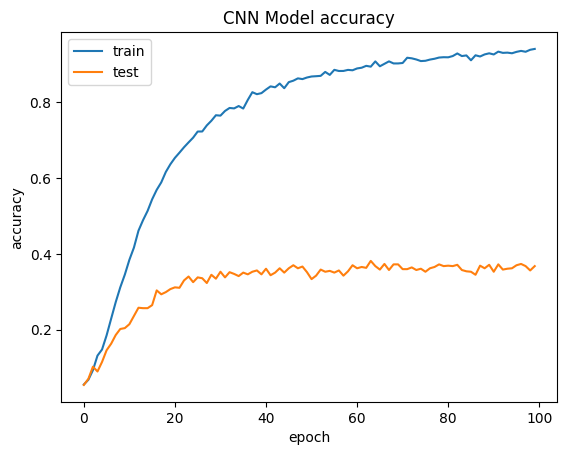

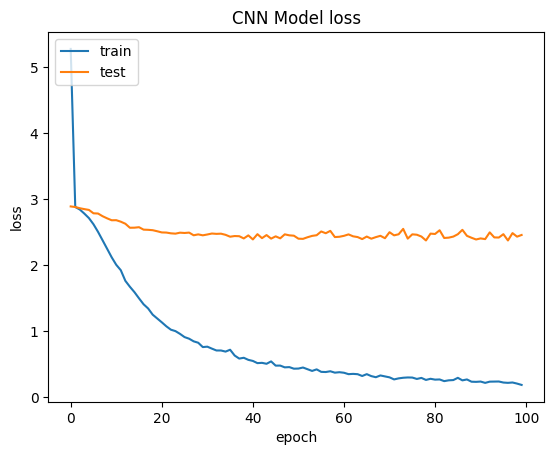

In [12]:
show_learning_curves(training, 'CNN ')

<font color = 'steelblue'><b> The model is definitely learning from the data this time which is a big improvement over iteration 1 which can be seen from how the training accuracy increases through the epochs and training loss decreases through the epochs. Despite this, the model seems to be overfitting as the test accuracy doesn't increase as much as the training accuracy, ending somewhere between 30% and 40% accuracy compared to the training accuracy of nearly 90%. This is further shown by the loss graph as test loss does not decrease but continuously hovers around 2 to 3.

Let's move on to see exactly what feature maps the model is learning.  </b></font>

In [13]:
from keras.models import Model

def display_activation(activations, activation_index, ncols=5, size=(12, 12), reshape=None):

    activation = activations[activation_index]

    print('Shape of layer: ', activation.shape)

    if len(activation.shape) > 2:
        total_fmaps = activation.shape[-1] # the last axis of the array
        nrows = int(np.ceil(total_fmaps / ncols))
    else:
        total_fmaps = 1
        nrows,ncols = (1,1)

    feature_map=0

    if (ncols, nrows) == (1,1):
        plt.yticks([], [])
        plt.xticks(fontsize=6)
        if reshape == None:
            plt.imshow(activation[0].reshape(-1,1).T)
        else:
            plt.imshow(activation[0].reshape(reshape).T)
        plt.show()
        return

    fig = plt.figure(figsize=size)
    fig.subplots_adjust(hspace=0.23, wspace=0.22)

    for row in range(nrows):
        for col in range(ncols):
            subplot = fig.add_subplot(nrows, ncols, feature_map+1)
            #subplot[row][col].imshow(activation[0, :, :, feature_map],
            #                         cmap='gray')
            #subplot[row][col].tick_params(labelsize = 3)
            subplot.imshow(activation[0, :, :, feature_map])# cmap='gray')
            subplot.tick_params(labelsize = 3)

            feature_map += 1
            if feature_map == total_fmaps:
                plt.show()
                return

<font color = 'steelblue'><b> Here we take a random sample image from the test set to see how the model performs on it </b></font>

In [23]:
import random

layer_outputs = [layer.output for layer in CNN_model.layers]

layer_names = [layer.name.split('_')[0] for layer in CNN_model.layers]

activation_model = Model(inputs=CNN_model.layers[0].input, outputs=layer_outputs)

sample_idx = random.randint(0, X_test.shape[0] - 1)
img_sample = X_test[sample_idx].reshape((1, *input_shape))

activations = activation_model.predict(img_sample)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step


<font color = 'steelblue'><b> Let's see our sample image and its associated label </b></font>

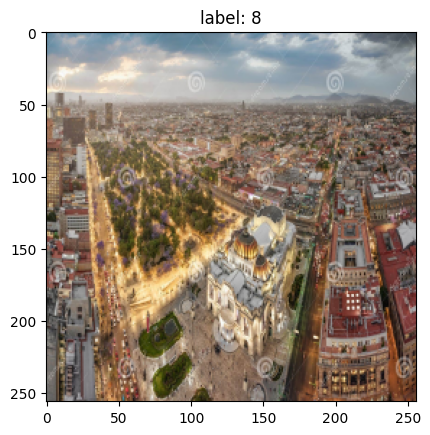

In [24]:
sample_img_rgb = cv2.cvtColor(X_test[sample_idx], cv2.COLOR_BGR2RGB)

plt.imshow(sample_img_rgb)
plt.title(f'label: {Y_test[sample_idx]}')
plt.show()

<font color = 'steelblue'><b> Now lets see what the feature maps and the subsequent dense layers of this image look like </b></font>

Type of layer:  conv2d
Shape of layer:  (1, 254, 254, 64)


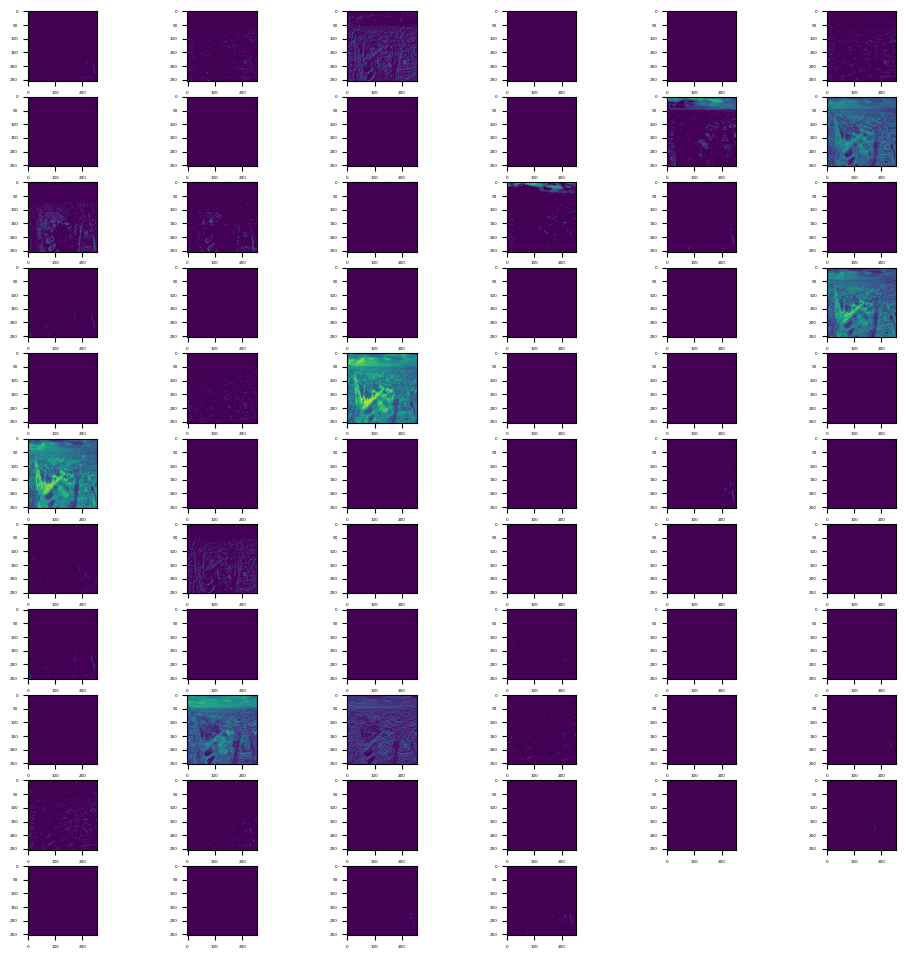

Type of layer:  conv2d
Shape of layer:  (1, 252, 252, 64)


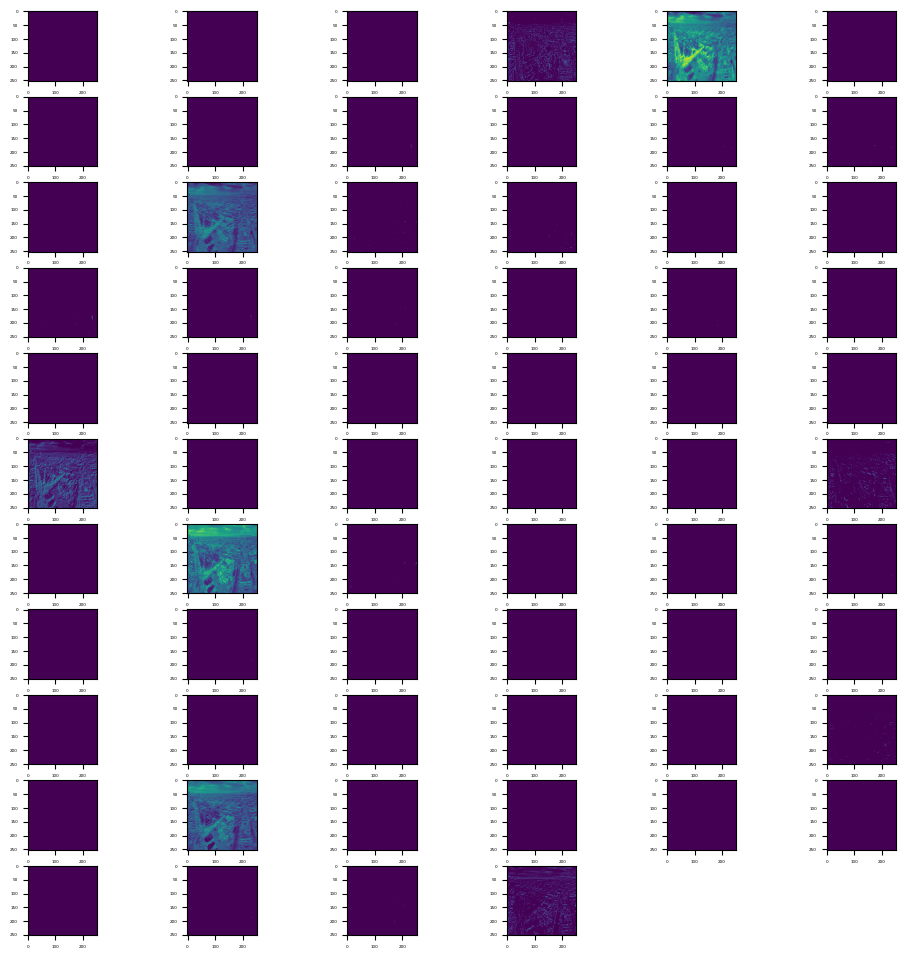

Type of layer:  dropout
Type of layer:  max
Type of layer:  conv2d
Shape of layer:  (1, 124, 124, 64)


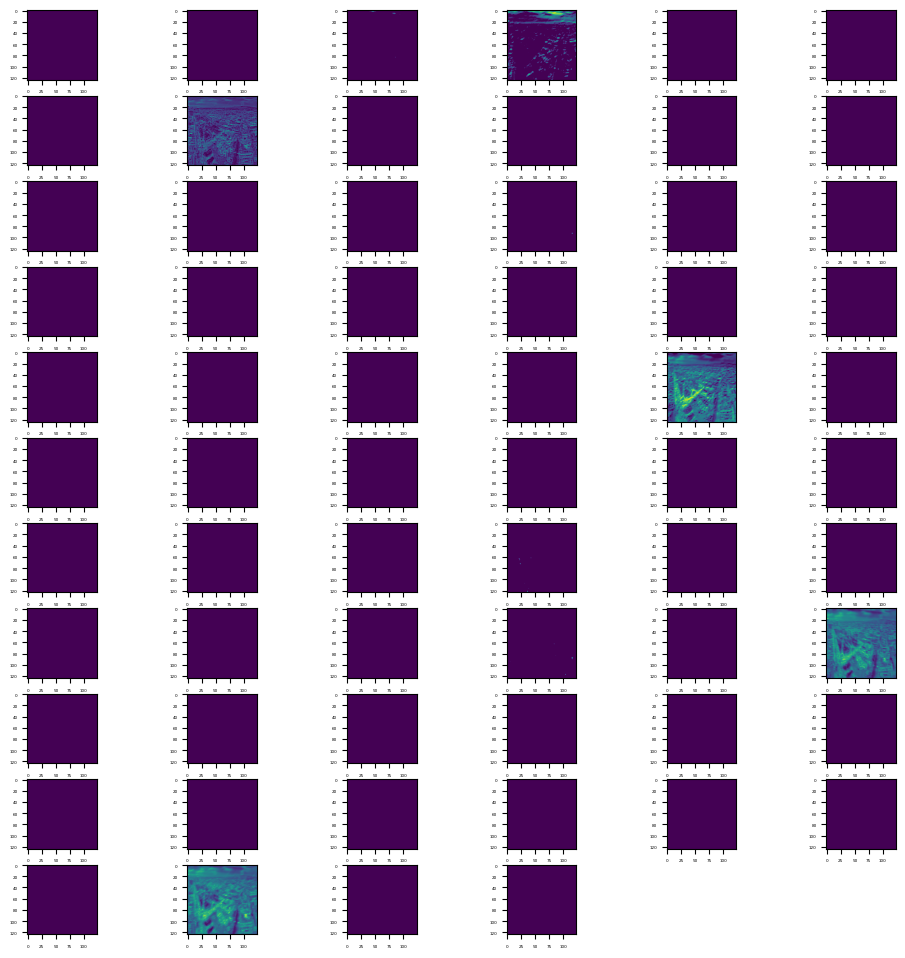

Type of layer:  conv2d
Shape of layer:  (1, 122, 122, 64)


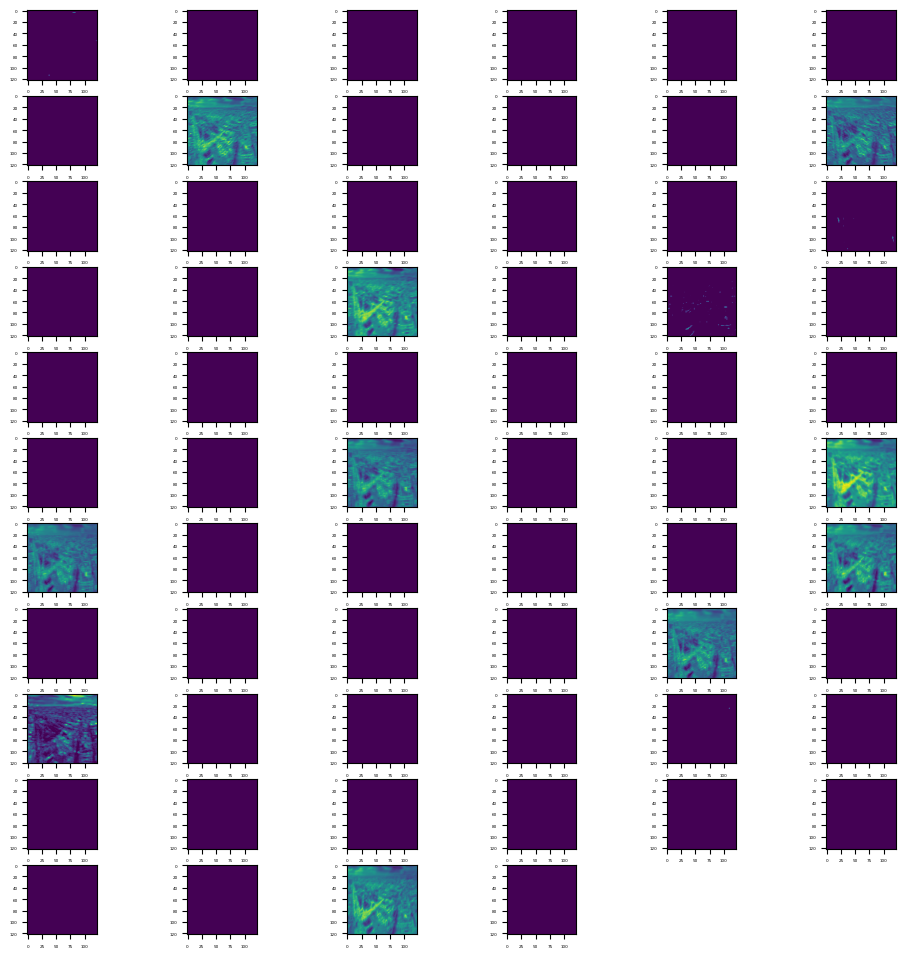

Type of layer:  dropout
Type of layer:  max
Type of layer:  conv2d
Shape of layer:  (1, 59, 59, 32)


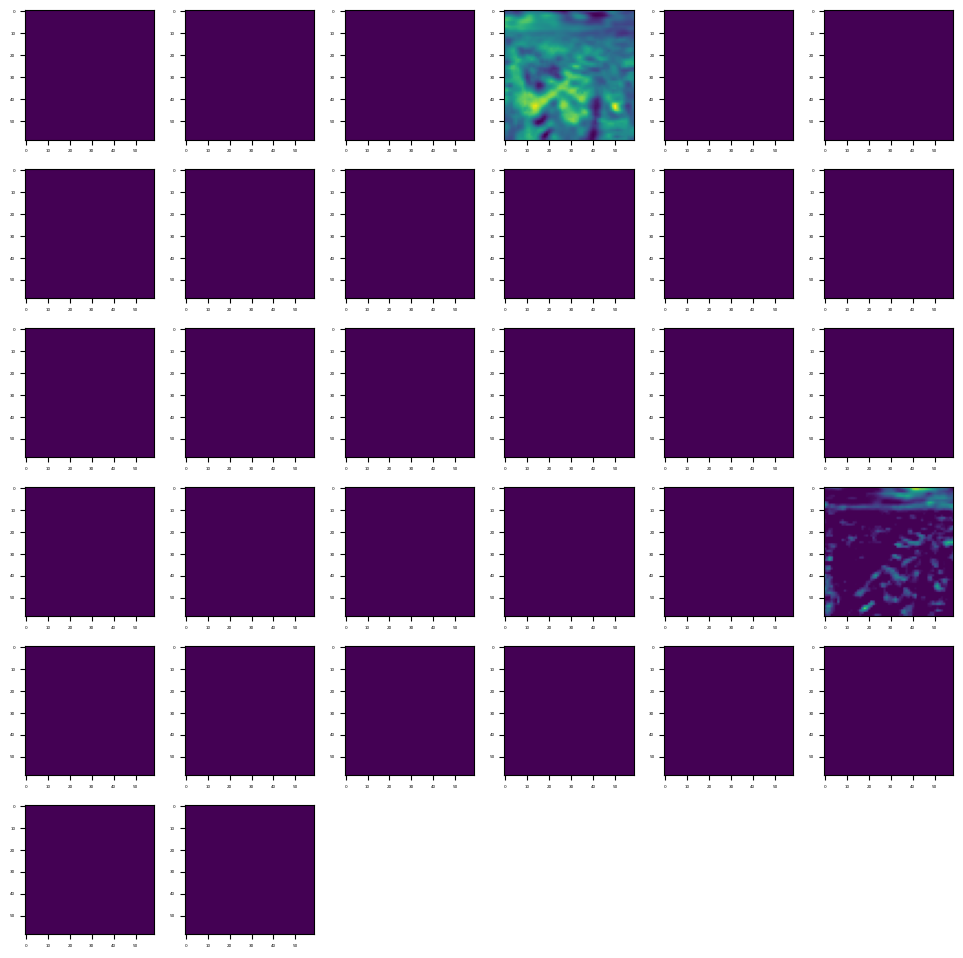

Type of layer:  conv2d
Shape of layer:  (1, 57, 57, 32)


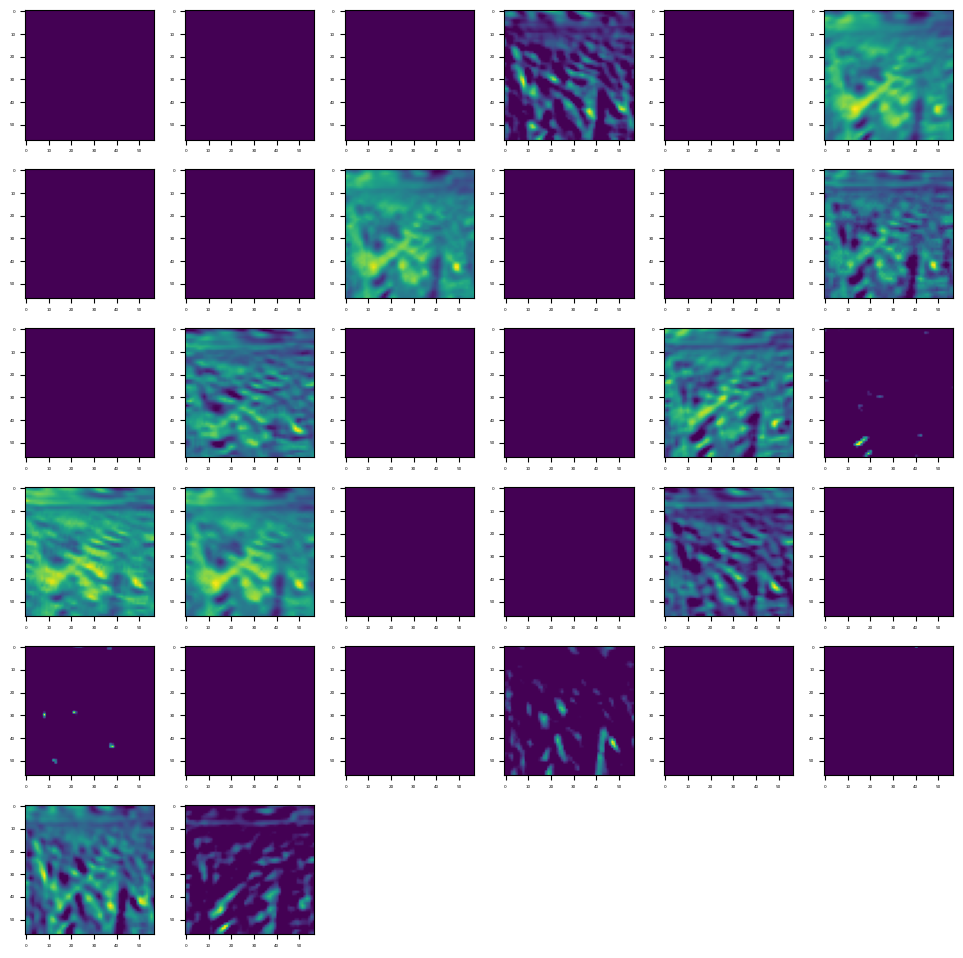

Type of layer:  dropout
Type of layer:  max
Type of layer:  conv2d
Shape of layer:  (1, 26, 26, 32)


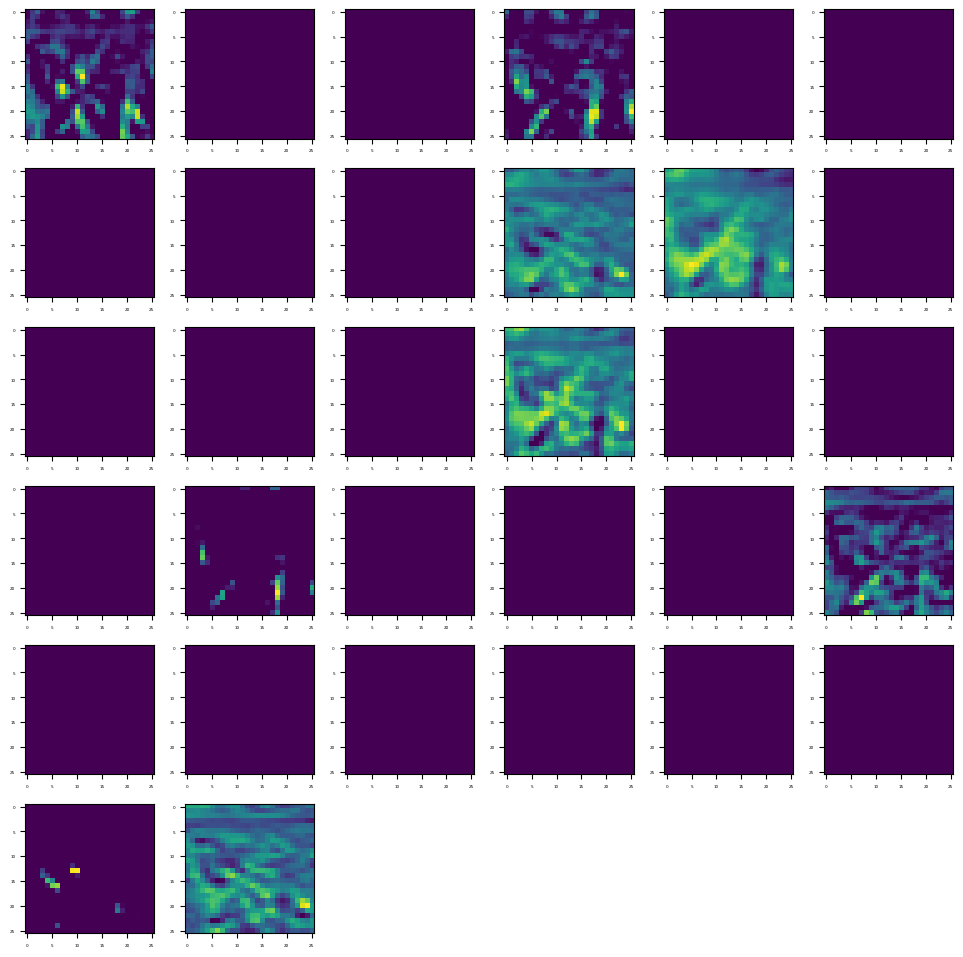

Type of layer:  conv2d
Shape of layer:  (1, 24, 24, 32)


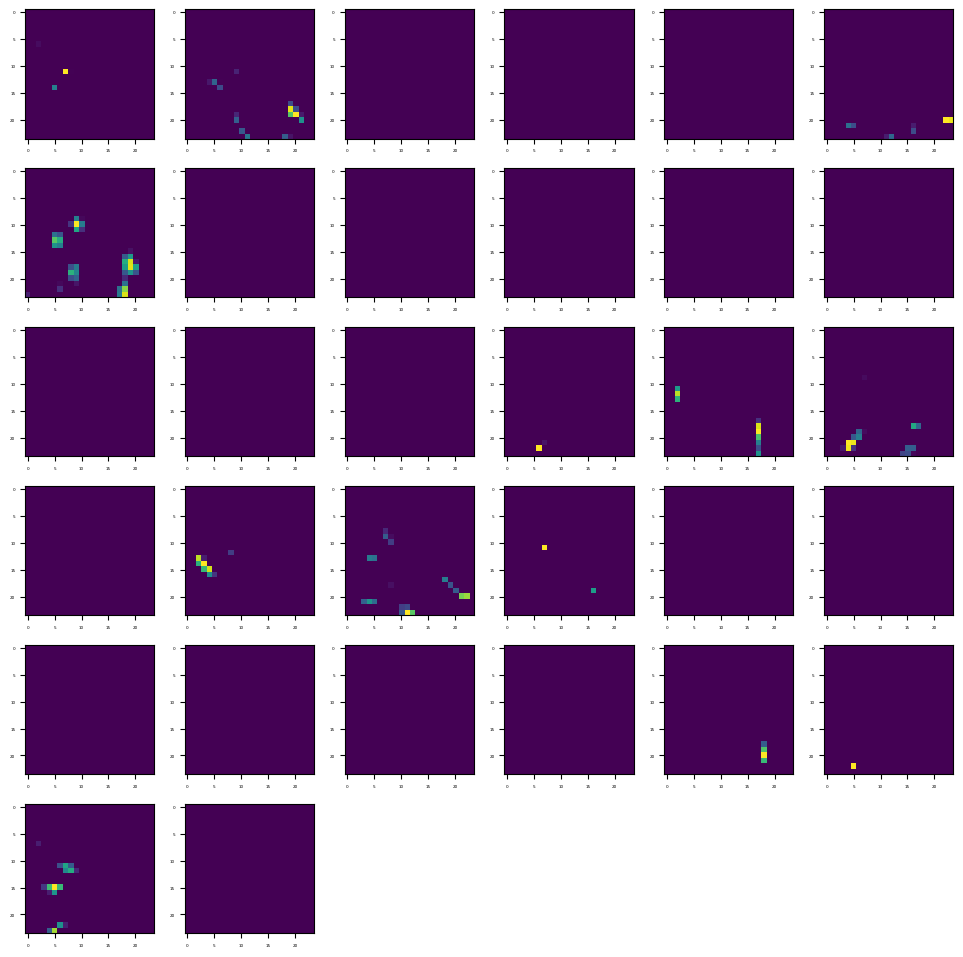

Type of layer:  dropout
Type of layer:  max
Type of layer:  flatten
Type of layer:  dense
Shape of layer:  (1, 512)


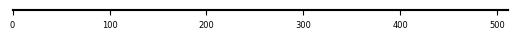

Type of layer:  dropout
Type of layer:  dense
Shape of layer:  (1, 18)


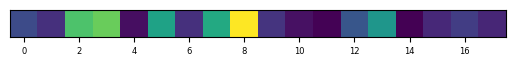

In [25]:
for i in range(len(layer_names)):
    print('Type of layer: ', layer_names[i])
    if layer_names[i] == 'conv2d':
        display_activation(activations, i, 6)
    if layer_names[i] == 'dense':
        display_activation(activations, i, 1)

In [ ]:
f'Predicted label: {np.argmax(activations[-1])}'

'Predicted label: 8'

<font color = 'steelblue'><b> Despite predicting the correct label, it seems that the feature maps produce a lot of dead activations which is very concerning but the last layers seems to have extracted some features. This could be because of the ReLU activation function zeroing any activation below zero, which may be helped by using batch normalization layers and using an activation function such as leaky ReLU. <b></font>

### <font color = 'steelblue'> **Analysis** </font>

#### Solution and Justification:
For this iteration, we opted for a combination of K-NN, AdaBoost (boosting decision stumps), and a CNN model trained on RGB images. Decision trees and random forests were excluded due to their computational demands and low accuracy.


#### Solution Details:
1. **K-NN with Combined Features**: Combined raw grayscale, HOG, and Sobel features, normalized for improved performance, resulting in a cross-validated score of 0.274, notably worse than standalone HOG features.
   
2. **Boosting Decision Stump - AdaBoost**: Utilized AdaBoost with decision tree stumps, achieving a cross-validated score of 0.126,.
   
3. **CNN with RGB Images**: Transitioned from grayscale to RGB images and adjusted CNN architecture to handle larger images with reduced dense layers.

#### Lessons Learnt:
- Combined features in K-NN did not yield satisfactory results compared to standalone HOG features.
- AdaBoost with decision stumps showed limited improvement in accuracy.
- Transitioning to RGB images in the CNN model may lead to better performance, but further adjustments to architecture and training strategy are required.
- A CNN seems to be the most promising 

## <font color = 'skyblue'>  **Iteration 3** </font>

For this iteration, we will work on improving the CNN as the previous models did not work well. To do that, we will utilize pretrained CNN models and freeze the weights for the layers that were pretrained, adding our own dense layers afterwards. 

The models we will try are:
1. ResNet50
2. ConvNeXt

### <font color = 'steelblue'> **Model 1: ResNet** </font>

In [6]:
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, GlobalAveragePooling2D
from keras.applications import ResNet50
from keras.models import Sequential, Model
import numpy as np
from keras.metrics import SparseTopKCategoricalAccuracy

In [7]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(color, labels, test_size=0.2, shuffle=True,stratify = labels)

X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((6981, 256, 256, 3), (1746, 256, 256, 3), (6981,), (1746,))

<font color = 'steelblue'><b> We take only the feature extraction layers from ResNet50 and add a final global average pooling layer before flattening and adding 2 dense layers onto the end for classification. 

We freeze all of the ResNet50 layers to make sure that they are untrainable as the weights have already been trained on large datasets.</b></font>

In [8]:
input_shape = (img_shape[0], img_shape[1], 3)
res = ResNet50(input_shape=input_shape, weights='imagenet', pooling='avg', include_top=False)

x1 = res.output
x1 = Flatten()(x1)
predictions = Dense(num_classes, activation='softmax')(x1)

for layer in res.layers:
    layer.trainable = False
    

CNN_model = Model(res.input, predictions)
CNN_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy', SparseTopKCategoricalAccuracy(k=3)])

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


<font color = 'steelblue'><b> Let's take a look at the model summary </b></font>

In [9]:
CNN_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 64, 64,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 64, 64,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 64, 64,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_3_c

 Total params: 23,624,594 (90.12 MB)

 Trainable params: 40,978 (160.07 KB)

 Non-trainable params: 23,583,616 (89.96 MB)

<font color = 'steelblue'><b> There are a lot less trainable parameters in this model and with the pretrained feature extraction layers the model should have a much easier time learning from the images while having a better output as ResNet50 has been trained on millions of images.</b></font>

### <font color = 'steelblue'><b> Train the CNN </b></font>

In [10]:
batches = 128
num_epochs = 80

training = CNN_model.fit(X_train, Y_train,
                         batch_size=batches,
                         epochs=num_epochs,
                         validation_data=(X_test,
                                          Y_test))

score = CNN_model.evaluate(X_test, Y_test, verbose=0)

print('Test score: ', score[0])
print('Test accuracy: ', score[1])

Epoch 1/80


I0000 00:00:1714729212.450659     117 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1714729212.500769     117 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 624ms/step - accuracy: 0.2017 - loss: 2.7047 - sparse_top_k_categorical_accuracy: 0.3807

W0000 00:00:1714729246.374302     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714729251.495695     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


55/55 ━━━━━━━━━━━━━━━━━━━━ 96s 1s/step - accuracy: 0.2039 - loss: 2.6973 - sparse_top_k_categorical_accuracy: 0.3835 - val_accuracy: 0.4765 - val_loss: 1.8106 - val_sparse_top_k_categorical_accuracy: 0.7010
Epoch 2/80


W0000 00:00:1714729273.776369     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 434ms/step - accuracy: 0.5516 - loss: 1.5689 - sparse_top_k_categorical_accuracy: 0.7754 - val_accuracy: 0.5430 - val_loss: 1.5526 - val_sparse_top_k_categorical_accuracy: 0.7566
Epoch 3/80
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 441ms/step - accuracy: 0.6439 - loss: 1.2647 - sparse_top_k_categorical_accuracy: 0.8364 - val_accuracy: 0.5951 - val_loss: 1.4009 - val_sparse_top_k_categorical_accuracy: 0.7984
Epoch 4/80
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 435ms/step - accuracy: 0.6997 - loss: 1.0879 - sparse_top_k_categorical_accuracy: 0.8699 - val_accuracy: 0.6140 - val_loss: 1.3126 - val_sparse_top_k_categorical_accuracy: 0.8162
Epoch 5/80
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 434ms/step - accuracy: 0.7385 - loss: 0.9663 - sparse_top_k_categorical_accuracy: 0.8878 - val_accuracy: 0.6346 - val_loss: 1.2636 - val_sparse_top_k_categorical_accuracy: 0.8259
Epoch 6/80
55/55 ━━━━━━━━━━━━━━━━━━━━ 24s 436ms/step - accuracy: 0.7635 - loss: 0.8617 - sparse_top_k_categorical_accuracy: 0.9

W0000 00:00:1714731189.204076     114 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


Test score:  1.2669322490692139
Test accuracy:  0.7245131731033325


W0000 00:00:1714731200.615709     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


### <font color = 'steelblue'><b> Visualise the CNN features </b></font>

<font color = 'steelblue'><b> We save the model for future usage </b></font>

In [11]:
if KAGGLE:
    CNN_model.save("/kaggle/working/resnet_model.keras") 
else:
    CNN_model.save("./models/resnet_model.keras") 

<font color = 'steelblue'><b> Now we will check the accuracy and loss graphs across training </b></font>

In [12]:
def show_learning_curves(learning_evolution, title=''):

    # list all data stored in the learning_evolution object
    print('Stored information:', [h for h in learning_evolution.history.keys()])

    # show evolution of accuracy
    plt.plot(learning_evolution.history['accuracy'])

    # show evolution of cross-validated accuracy
    if 'val_accuracy' in learning_evolution.history:
        plt.plot(learning_evolution.history['val_accuracy'])

    plt.title(title + 'Model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')

    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

    # show evolution of loss
    plt.plot(learning_evolution.history['loss'])
    
     # show evolution of cross-validated loss
    if 'val_accuracy' in learning_evolution.history:
        plt.plot(learning_evolution.history['val_loss'])

    plt.title(title + 'Model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

Stored information: ['accuracy', 'loss', 'sparse_top_k_categorical_accuracy', 'val_accuracy', 'val_loss', 'val_sparse_top_k_categorical_accuracy']


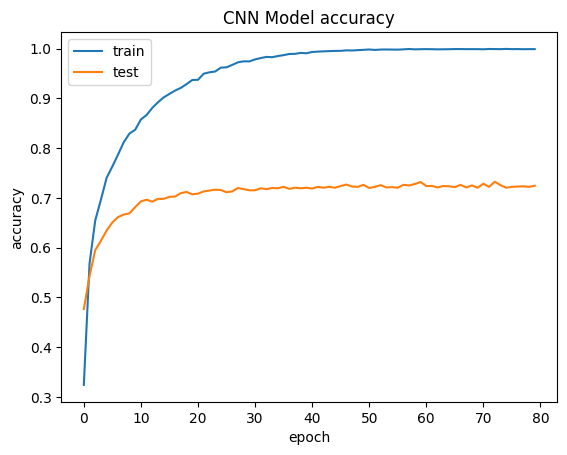

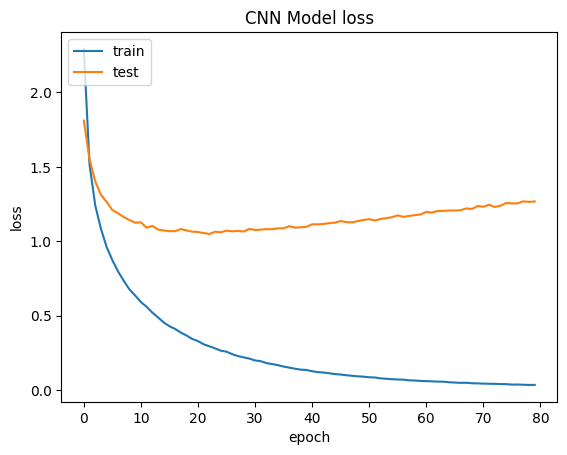

In [13]:
show_learning_curves(training, 'CNN ')

<font color = 'steelblue'><b> These graphs look much better than the graphs from the previous iterations. The training and testing accuracies both increase and flatten out, though the model does still seem to be overfitting since the training accuracy gets close to 100% while the testing accuracy stays just over 70%. The loss also suggests this as it gets to a minimum at around 20 epochs and then seems to increase again but it is still much lower than the model in iteration 2.

Now we will view the feature maps from the convolutional layers</b></font>

In [14]:
from keras.models import Model

def display_activation(activations, activation_index, ncols=5, size=(12, 12), reshape=None):

    activation = activations[activation_index]

    print('Shape of layer: ', activation.shape)

    if len(activation.shape) > 2:
        total_fmaps = activation.shape[-1] # the last axis of the array
        nrows = int(np.ceil(total_fmaps / ncols))
    else:
        total_fmaps = 1
        nrows,ncols = (1,1)

    feature_map=0

    if (ncols, nrows) == (1,1):
        plt.yticks([], [])
        plt.xticks(fontsize=6)
        if reshape == None:
            plt.imshow(activation[0].reshape(-1,1).T)
        else:
            plt.imshow(activation[0].reshape(reshape).T)
        plt.show()
        return

    fig = plt.figure(figsize=size)
    fig.subplots_adjust(hspace=0.23, wspace=0.22)

    for row in range(nrows):
        for col in range(ncols):
            subplot = fig.add_subplot(nrows, ncols, feature_map+1)
            #subplot[row][col].imshow(activation[0, :, :, feature_map],
            #                         cmap='gray')
            #subplot[row][col].tick_params(labelsize = 3)
            subplot.imshow(activation[0, :, :, feature_map])# cmap='gray')
            subplot.tick_params(labelsize = 3)

            feature_map += 1
            if feature_map == total_fmaps:
                plt.show()
                return

In [15]:
import random

layer_outputs = [layer.output for layer in CNN_model.layers]

layer_names = [layer.name.split('_')[-1] for layer in CNN_model.layers]

activation_model = Model(inputs=CNN_model.input, outputs=layer_outputs)

sample_idx = random.randint(0, X_test.shape[0] - 1)
img_sample = X_test[sample_idx].reshape((1, *input_shape))

activations = activation_model.predict(img_sample)

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


<font color = 'steelblue'><b> We choose a random sample from the test set </b></font>

'label: 0'

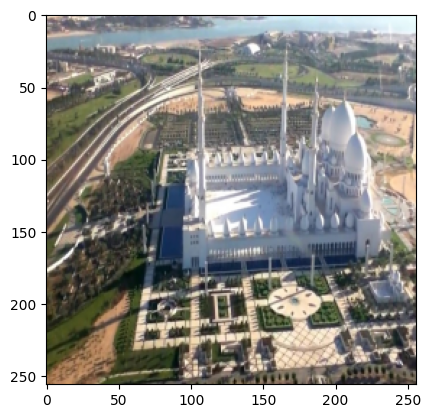

In [16]:
sample_image_rgb = cv2.cvtColor(X_test[sample_idx], cv2.COLOR_BGR2RGB)
plt.imshow(sample_image_rgb)
f'label: {Y_test[sample_idx]}'

<font color = 'steelblue'><b> Because of the large number of convolutional layers we will only look at the first and last feature maps </b></font>

Shape of layer:  (1, 128, 128, 64)


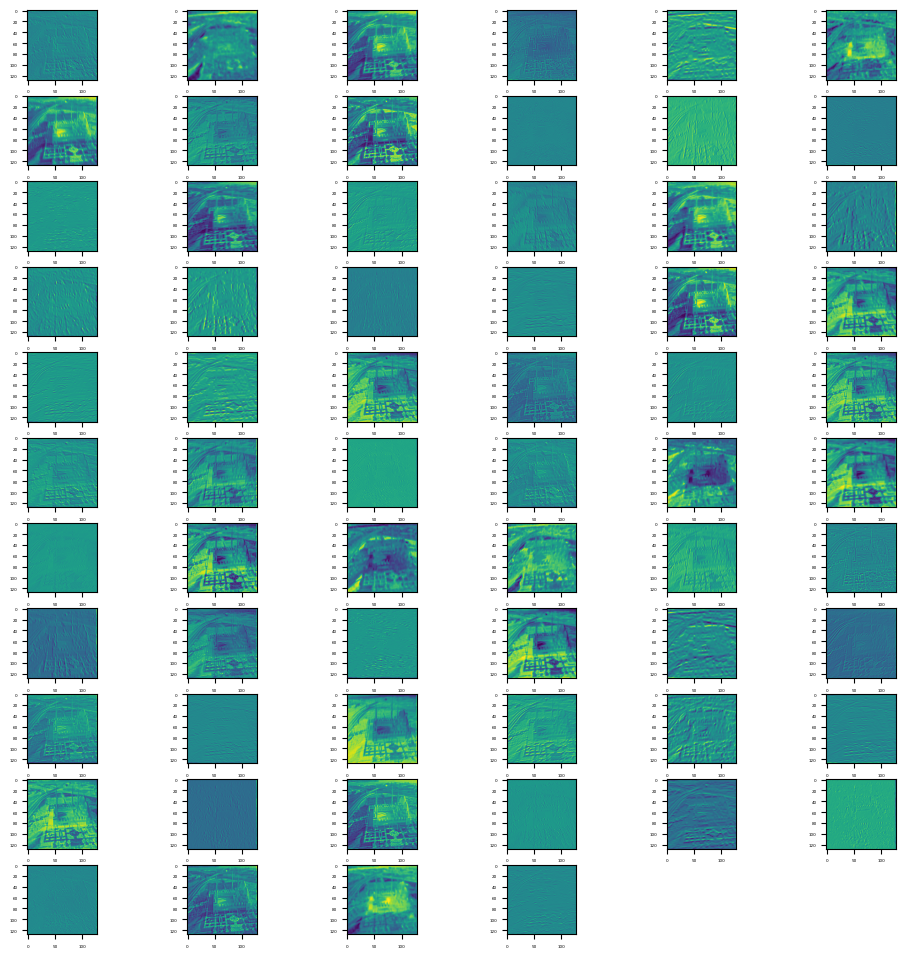

Shape of layer:  (1, 8, 8, 2048)


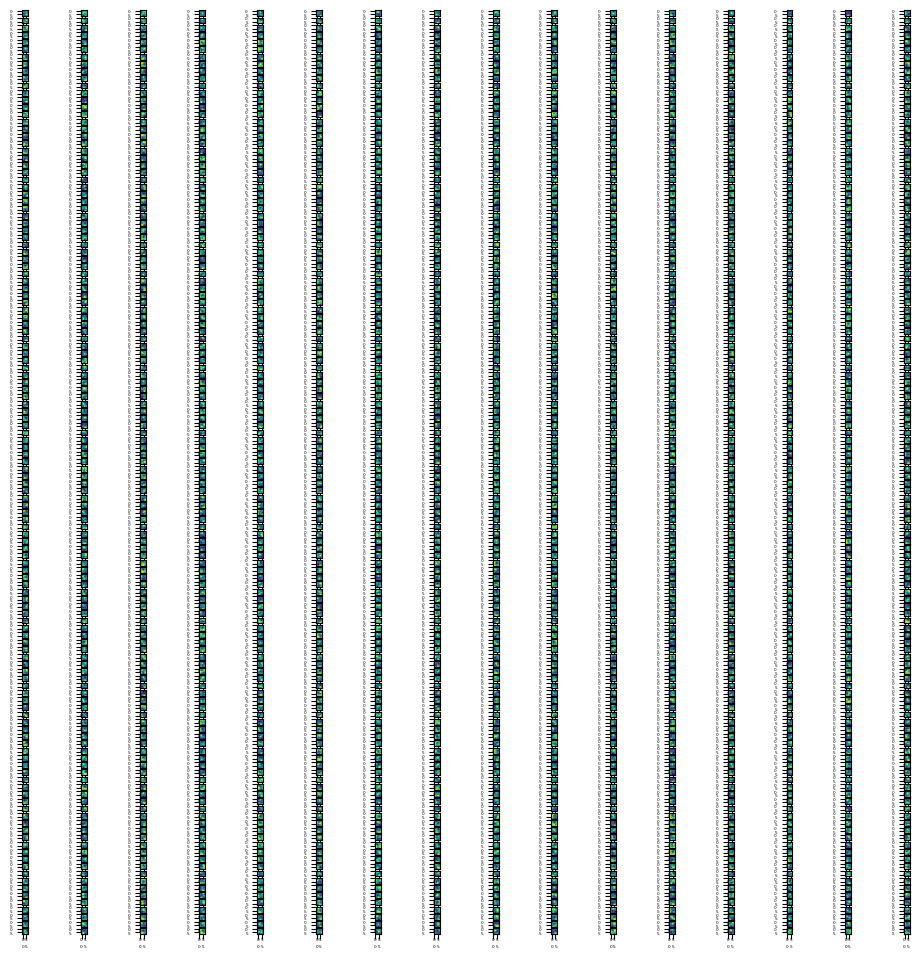

In [17]:
# show feature map of first convolutional layer
for i in range(len(layer_names)):
    if 'conv' in layer_names[i]:
        display_activation(activations, i, 6)
        break
    
# show feature map of last convolutional layer
for i in range(len(layer_names)-1, -1, -1):
    if 'conv' in layer_names[i]:
        display_activation(activations, i, 16)
        break

<font color = 'steelblue'><b> We will look at the last dense layer </b></font>

Shape of layer:  (1, 18)


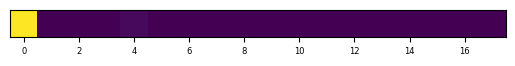

In [18]:
display_activation(activations,-1,1)
        

In [19]:
np.argmax(activations[-1])

0

<font color = 'steelblue'><b> It seems as though it has predicted correctly with high confidence. But can we do better?</b></font>

### <font color = 'steelblue'> **Model 2: ConvNeXt** </font>

<font color = 'steelblue'><b> We will now look at how the pre-trained model ConvNeXt does comparatively 

Similar to ResNet, all ConvNeXt layers are frozen, pooled with global average and fed into a dense layer </b></font>

In [5]:
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten
from keras.applications import ConvNeXtBase
from keras.models import Sequential, Model
import numpy as np
from keras.metrics import SparseTopKCategoricalAccuracy


input_shape = img_shape
convnext = ConvNeXtBase(input_shape=input_shape, weights='imagenet', pooling='avg', include_top=False)
prediction = Dense(num_classes, activation='softmax')(convnext.output)

# freeze all ConvNeXt layers 
for layer in convnext.layers:
    layer.trainable = False

CNN_model = Model(convnext.inputs, prediction)

CNN_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy', SparseTopKCategoricalAccuracy(k=3)])

350926856/350926856 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


<font color = 'steelblue'><b> We check the model summary to see the structure of our model with the output shapes of every layer and the number of trainable parameters per layer.  </b></font>

In [6]:
CNN_model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_pres… │ (None, 256, 256,  │          0 │ input_layer[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stem  │ (None, 64, 64,    │      6,528 │ convnext_base_pr… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 64, 64,    │      6,400 │ convnext_base_st… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 64, 64,    │        256 │ convnext_base_st… │
│ (LayerNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 64, 64,    │     66,048 │ convnext_base_st… │
│ (Dense)             │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 64, 64,    │          0 │ convnext_base_st… │
│ (Activation)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 64, 64,    │     65,664 │ convnext_base_st… │
│ (Dense)             │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 64, 64,    │        128 │ convnext_base_st… │
│ (LayerScale)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 64, 64,    │          0 │ convnext_base_st… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 64, 64,    │          0 │ convnext_base_st… │
│                     │ 128)              │            │ convnext_base_st… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 64, 64,    │      6,400 │ add[0][0]         │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 64, 64,    │        256 │ convnext_base_st… │
│ (LayerNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 64, 64,    │     66,048 │ convnext_base_st… │
│ (Dense)             │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 64, 64,    │          0 │ convnext_base_st… │
│ (Activation)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 64, 64,    │     65,664 │ convnext_base_st… │
│ (Dense)             │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_base_stag… │ (None, 64, 64,    │        128 │ convnext_base_st

 Total params: 87,584,914 (334.11 MB)

 Trainable params: 18,450 (72.07 KB)

 Non-trainable params: 87,566,464 (334.04 MB)

<font color = 'steelblue'><b> Same as with ResNet, the small amount of trainable parameters should make it easier for the model to train, requiring less computational power and should help learn more with a small amount of data </b></font>

### <font color = 'steelblue'><b> Training the CNN </b></font>

<font color = 'steelblue'><b> To train the CNN we will first split the dataset into a train and test set. Because we don't have a large amount of examples, we will only use a small amount of data for cross-validation so that we can use most of the data for training the CNN. </b></font>

In [5]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(rgb_images, labels, test_size=0.1, shuffle=True)

X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((7854, 256, 256, 3), (873, 256, 256, 3), (7854,), (873,))

<font color = 'steelblue'><b> We use a batch size of 128 and around 80 epochs as we are only training the weights of the last dense layers, so we shouldn't need too many epochs to achieve the best accuracy. We provide the model with the test set to validate so that we can check its generalisability across epochs. </b></font>

In [8]:
batches = 128
num_epochs = 80

training = CNN_model.fit(X_train, Y_train,
                         batch_size=batches,
                         epochs=num_epochs,
                         validation_data=(X_test,
                                          Y_test))

score = CNN_model.evaluate(X_test, Y_test, verbose=0)

print('Test score: ', score[0])
print('Test accuracy: ', score[1])

Epoch 1/80


2024-05-02 15:33:37.260927: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng30{k2=0,k4=3,k5=1,k6=0,k7=0} for conv (f32[128,128,64,64]{3,2,1,0}, u8[0]{0}) custom-call(f32[128,128,64,64]{3,2,1,0}, f32[128,1,7,7]{3,2,1,0}), window={size=7x7 pad=3_3x3_3}, dim_labels=bf01_oi01->bf01, feature_group_count=128, custom_call_target="__cudnn$convForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-05-02 15:33:37.439287: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.178482162s
Trying algorithm eng30{k2=0,k4=3,k5=1,k6=0,k7=0} for conv (f32[128,128,64,64]{3,2,1,0}, u8[0]{0}) custom-call(f32[128,128,64,64]{3,2,1,0}, f32[128,1,7,7]{3,2,1,0}), window={size=7x7 pad=3_3x3_3}, dim_labels=bf01_oi01->bf01, feature_group_count=128, custom_call_target="__cudnn$convForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scal

61/62 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.2603 - loss: 2.5895 - sparse_top_k_categorical_accuracy: 0.4615

W0000 00:00:1714664155.219409      88 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2626 - loss: 2.5806 - sparse_top_k_categorical_accuracy: 0.4641

W0000 00:00:1714664163.402464      85 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714664163.402883      85 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714664163.403444      85 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
2024-05-02 15:36:18.382890: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng30{k2=0,k4=3,k5=1,k6=0,k7=0} for conv (f32[105,128,64,64]{3,2,1,0}, u8[0]{0}) custom-call(f32[105,128,64,64]{3,2,1,0}, f32[128,1,7,7]{3,2,1,0}), window={size=7x7 pad=3_3x3_3}, dim_labels=bf01_oi01->bf01, feature_group_count=128, custom_call_target="__cudnn$convForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-05-02 15:36:18.393679: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.0108973

62/62 ━━━━━━━━━━━━━━━━━━━━ 211s 3s/step - accuracy: 0.2649 - loss: 2.5720 - sparse_top_k_categorical_accuracy: 0.4667 - val_accuracy: 0.5704 - val_loss: 1.4161 - val_sparse_top_k_categorical_accuracy: 0.7938
Epoch 2/80
62/62 ━━━━━━━━━━━━━━━━━━━━ 112s 2s/step - accuracy: 0.6307 - loss: 1.2775 - sparse_top_k_categorical_accuracy: 0.8194 - val_accuracy: 0.6632 - val_loss: 1.1334 - val_sparse_top_k_categorical_accuracy: 0.8362
Epoch 3/80
62/62 ━━━━━━━━━━━━━━━━━━━━ 112s 2s/step - accuracy: 0.7150 - loss: 1.0150 - sparse_top_k_categorical_accuracy: 0.8814 - val_accuracy: 0.7022 - val_loss: 0.9902 - val_sparse_top_k_categorical_accuracy: 0.8694
Epoch 4/80
62/62 ━━━━━━━━━━━━━━━━━━━━ 112s 2s/step - accuracy: 0.7589 - loss: 0.8675 - sparse_top_k_categorical_accuracy: 0.9047 - val_accuracy: 0.7331 - val_loss: 0.9193 - val_sparse_top_k_categorical_accuracy: 0.8889
Epoch 5/80
62/62 ━━━━━━━━━━━━━━━━━━━━ 112s 2s/step - accuracy: 0.7912 - loss: 0.7676 - sparse_top_k_categorical_accuracy: 0.9181 - val_

W0000 00:00:1714673097.795226      87 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


Test score:  0.7626089453697205
Test accuracy:  0.8407789468765259


W0000 00:00:1714673115.437471      88 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714673115.437990      88 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714673115.438554      88 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714673115.440234      88 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714673115.440952      88 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714673115.442299      88 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714673115.442746      88 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714673115.443200      88 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


<font color = 'steelblue'><b> We will save this model in case we want to load it later </b></font>

In [9]:
CNN_model.save("/kaggle/working/convnext_model.keras")

### <font color = 'steelblue'><b> Visualise the CNN features </b></font>

<font color = 'steelblue'><b> We will look at the graphs of the learning curves with both accuracy and loss. </b></font>

In [10]:
def show_learning_curves(learning_evolution, title=''):

    # list all data stored in the learning_evolution object
    print('Stored information:', [h for h in learning_evolution.history.keys()])

    # show evolution of accuracy
    plt.plot(learning_evolution.history['accuracy'])

    # show evolution of cross-validated accuracy
    if 'val_accuracy' in learning_evolution.history:
        plt.plot(learning_evolution.history['val_accuracy'])

    plt.title(title + 'Model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')

    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

    # show evolution of loss
    plt.plot(learning_evolution.history['loss'])
    
     # show evolution of cross-validated loss
    if 'val_accuracy' in learning_evolution.history:
        plt.plot(learning_evolution.history['val_loss'])

    plt.title(title + 'Model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

Stored information: ['accuracy', 'loss', 'sparse_top_k_categorical_accuracy', 'val_accuracy', 'val_loss', 'val_sparse_top_k_categorical_accuracy']


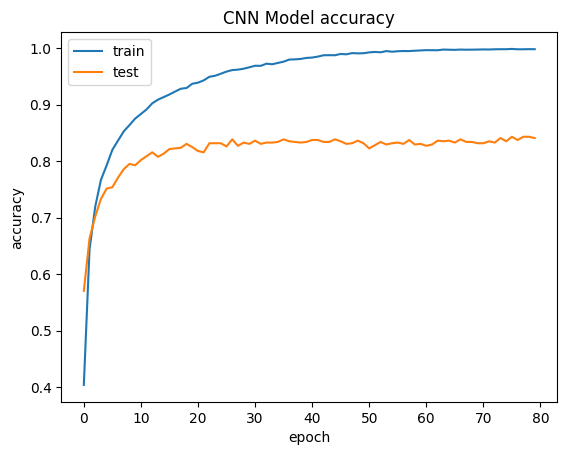

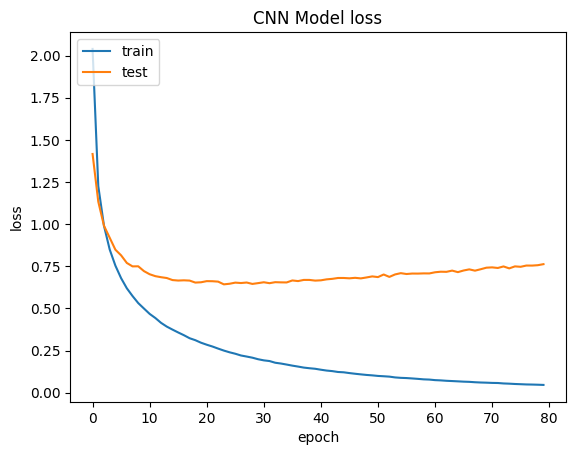

In [11]:
show_learning_curves(training, 'CNN ')

<font color = 'steelblue'><b> 
We can see that the model is learning well with both training and testing accuracy increasing and flattening out. ConvNeXt seems to perform better than ResNet as the testing accuracy goes up to 84%. It still seems to overfit but it is to a lesser degree than ResNet. The testing loss also stays lower than the testing loss seen from ResNet. 

Let's move on to see exactly what feature maps the model is learning.  </b></font>

In [12]:
from keras.models import Model

def display_activation(activations, activation_index, ncols=5, size=(12, 12), reshape=None):

    activation = activations[activation_index]

    print('Shape of layer: ', activation.shape)

    if len(activation.shape) > 2:
        total_fmaps = activation.shape[-1] # the last axis of the array
        nrows = int(np.ceil(total_fmaps / ncols))
    else:
        total_fmaps = 1
        nrows,ncols = (1,1)

    feature_map=0

    if (ncols, nrows) == (1,1):
        plt.yticks([], [])
        plt.xticks(fontsize=6)
        if reshape == None:
            plt.imshow(activation[0].reshape(-1,1).T)
        else:
            plt.imshow(activation[0].reshape(reshape).T)
        plt.show()
        return

    fig = plt.figure(figsize=size)
    fig.subplots_adjust(hspace=0.23, wspace=0.22)

    for row in range(nrows):
        for col in range(ncols):
            subplot = fig.add_subplot(nrows, ncols, feature_map+1)
            #subplot[row][col].imshow(activation[0, :, :, feature_map],
            #                         cmap='gray')
            #subplot[row][col].tick_params(labelsize = 3)
            subplot.imshow(activation[0, :, :, feature_map])# cmap='gray')
            subplot.tick_params(labelsize = 3)

            feature_map += 1
            if feature_map == total_fmaps:
                plt.show()
                return

<font color = 'steelblue'><b> Here we take a random sample image from the test set to see how the model performs on it </b></font>

In [7]:
import random

layer_outputs = [layer.output for layer in CNN_model.layers]

layer_names = [layer.name.split('_')[-1] for layer in CNN_model.layers]

activation_model = Model(inputs=CNN_model.input, outputs=layer_outputs)

sample_idx = random.randint(0, X_test.shape[0] - 1)
img_sample = X_test[sample_idx].reshape((1, *input_shape))

activations = activation_model.predict(img_sample)

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step


I0000 00:00:1714685198.054347     107 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1714685198.087183     107 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714685198.087569     107 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714685198.087964     107 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714685198.088915     107 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714685198.089307     107 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714685198.089680     107 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714685198.090036     107 graph_launch.cc:671] Fallback to op-by-op mode because m

<font color = 'steelblue'><b> Let's see our sample image and its associated label </b></font>

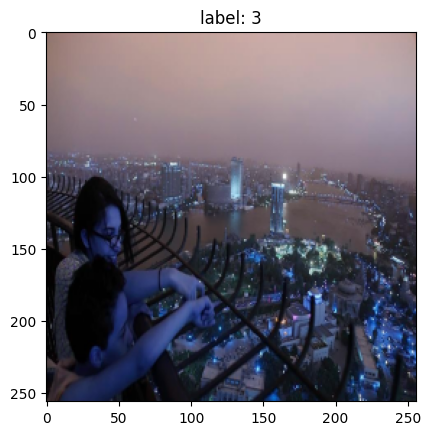

In [10]:
plt.imshow(X_test[sample_idx])
plt.title(f'label: {Y_test[sample_idx]}')
plt.show()

<font color = 'steelblue'><b> Now lets see what the feature maps and the subsequent dense layers of this image look like </b></font>

Shape of layer:  (1, 64, 64, 128)


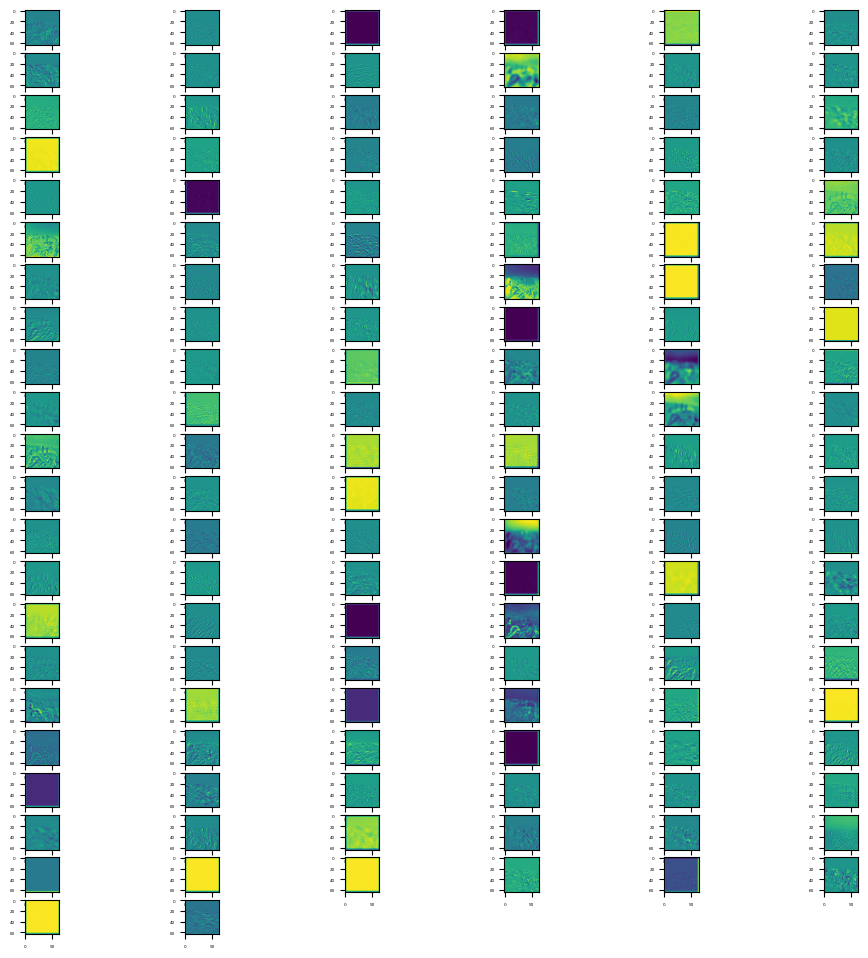

Shape of layer:  (1, 8, 8, 1024)


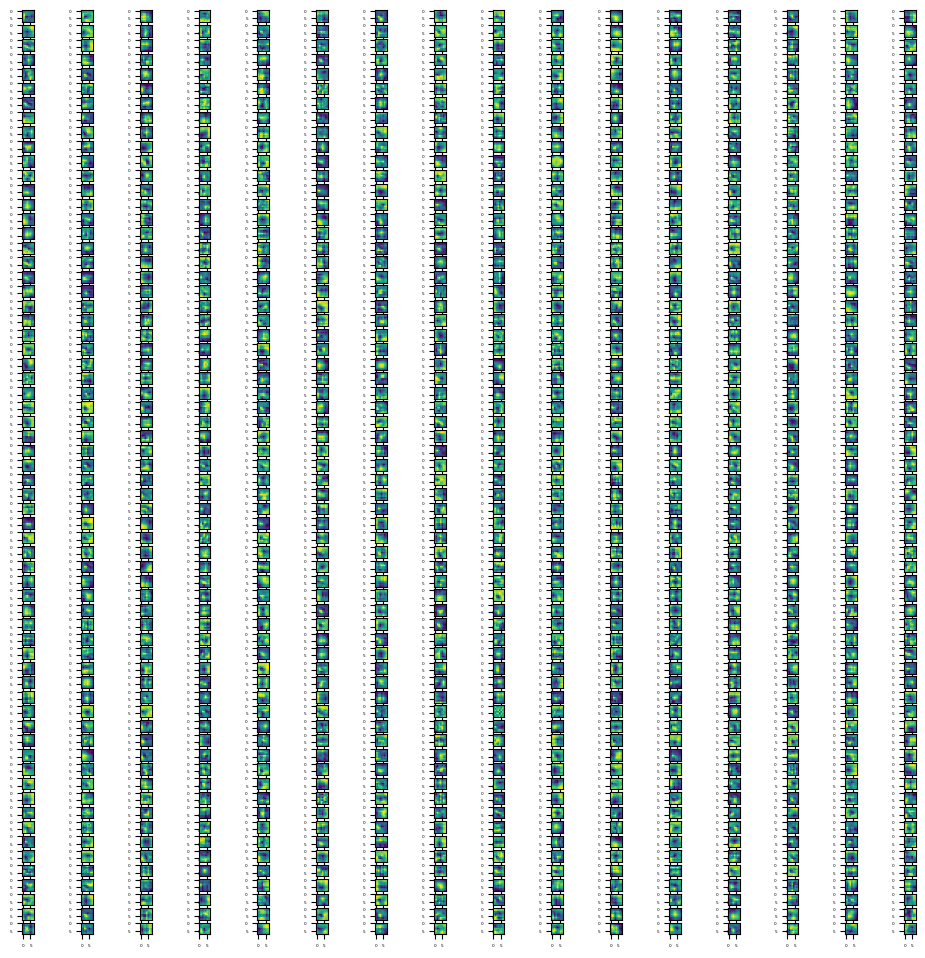

In [22]:
# show feature map of first convolutional layer
for i in range(len(layer_names)):
    if 'conv' in layer_names[i]:
        display_activation(activations, i, 6)
        break
    
# show feature map of last convolutional layer
for i in range(len(layer_names)-1, -1, -1):
    if 'conv' in layer_names[i]:
        display_activation(activations, i, 16)
        break

Shape of layer:  (1, 18)


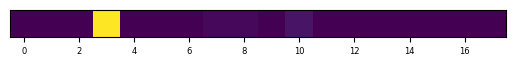

In [19]:
display_activation(activations, -1, 1)

In [20]:
f'Predicted label: {np.argmax(activations[-1])}'

'Predicted label: 3'

### <font color = 'steelblue'> **Analysis** </font>

#### Solution and Justification:
For this iteration, we opted to use pre-trained CNN models as they are more powerful feature extractors than the models we can train because they have been trained on millions of images and have much deeper structures than our models. For this reason we have decided to look into the models ResNet50 and ConvNeXt (specifically ConvNeXtBase) as feature extractors. ConvNeXtBase was chosen due to its relatively small size (~300MB) compared to the bigger ConvNeXt models and its accuracy on the imagenet database.


#### Solution Details:
1. **ResNet50**: We will use only the feature extraction layers from ResNet50 and freeze them all so they are not trainable. We will pass in 256x256 RGB images and pool the output with global average pooling before using a dense layer with the softmax activation function to obtain confidence values for each class. The ResNet model allowed us to achieve a test accuracy of 72% and an 85-86% accuracy within the top 3 results, showing massive improvements compared to all other models from iteration 2.
2. **ConvNeXt**: The steps taken to use the model are the same as with ResNet50. The ConvNeXt model allowed us to achieve an even higher test accuracy of 84% and a 93% accuracy within the top 3 results, showing improvements over the ResNet50 model.

#### Lessons Learnt:
- Pre-trained CNN models helped tremendously with extracting features from the images in our dataset

## <font color = 'skyblue' size = 5><b> Final Model Choice </b></font>

<font color = 'steelblue' size=4><b> From the models and features tested it is clear that the pre-trained and fine-tuned CNNs performed the best, of which ConvNeXt stands with the highest accuracy and generalisability.

ConvNeXt will be chosen as the model to be used in the Query Answering Machine.</b></font>